# Library Import

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt
%matplotlib inline

import math
import datetime
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import warnings
warnings.filterwarnings('ignore')

import random
import re

# Data Import

In [2]:
df_cal = pd.read_csv('calendar.csv')
df = pd.read_csv('sales_train_validation.csv')
df_prices = pd.read_csv('sell_prices.csv')

In [3]:
print(df.shape)
print(df.columns)

(30490, 1919)
Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd_1',
       'd_2', 'd_3', 'd_4',
       ...
       'd_1904', 'd_1905', 'd_1906', 'd_1907', 'd_1908', 'd_1909', 'd_1910',
       'd_1911', 'd_1912', 'd_1913'],
      dtype='object', length=1919)


In [4]:
df_submit = pd.read_csv('sample_submission.csv')

In [10]:
df_cal

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1964,2016-06-15,11620,Wednesday,5,6,2016,d_1965,NaN,NaN,NaN,NaN,0,1,1
1965,2016-06-16,11620,Thursday,6,6,2016,d_1966,NaN,NaN,NaN,NaN,0,0,0
1966,2016-06-17,11620,Friday,7,6,2016,d_1967,NaN,NaN,NaN,NaN,0,0,0
1967,2016-06-18,11621,Saturday,1,6,2016,d_1968,NaN,NaN,NaN,NaN,0,0,0


In [6]:
df_submit.head()

,id,F1,F2,F3,F4,F5,F6,F7,F8,F9,...,F19,F20,F21,F22,F23,F24,F25,F26,F27,F28
0,HOBBIES_1_001_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,HOBBIES_1_002_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,HOBBIES_1_004_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,HOBBIES_1_005_CA_1_validation,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
df.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


In [9]:
df.groupby('store_id').sum()

,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
store_id,,,,,,,,,,,,,,,,,,,,,
CA_1,4337,4155,2816,3051,2630,3276,3450,5437,4340,3157,...,3982,5437,5954,4345,3793,3722,3709,4387,5577,6113
CA_2,3494,3046,2121,2324,1942,2288,2629,3729,2957,2218,...,4440,5352,5760,3830,3631,3691,3303,4457,5884,6082
CA_3,4739,4827,3785,4232,3817,4369,4703,5456,5581,4912,...,5337,6936,8271,6068,5683,5235,5018,5623,7419,7721
CA_4,1625,1777,1386,1440,1536,1389,1469,1988,1818,1535,...,2496,2839,3047,2809,2677,2500,2458,2628,2954,3271
TX_1,2556,2687,1822,2258,1694,2734,1691,2820,2887,2174,...,3084,3724,4192,3410,3257,2901,2776,3022,3700,4033
TX_2,3852,3937,2731,2954,2492,3439,2588,3772,3657,2932,...,3897,4475,4998,3311,3727,3384,3446,3902,4483,4292
TX_3,3030,3006,2225,2169,1726,2833,1947,2848,2832,2213,...,3819,4261,4519,3147,3938,3315,3380,3691,4083,3957
WI_1,2704,2194,1562,1251,2,2049,2815,3248,1674,1355,...,3862,4862,4812,3236,3069,3242,3324,3991,4772,4874
WI_2,2256,1922,2018,2522,1175,2244,2232,2643,2140,1836,...,6259,5579,5566,4347,4464,4194,4393,4988,5404,5127


# Tidying up
The data came to me in fairly good condition. However, as a sanity check, I'll still check for missing values and make sure all data types are correct.

## Missing Values

In [8]:
print(df.isna().values.any())
print(df_prices.isna().values.any())
print(df_cal.isna().values.any())

False
False
True


In [9]:
df_cal.fillna('None', inplace = True)

The first two dataframes did not have any missing values. 'df_cal' did. However, this dataframe essentially just lets us know whether a specific day was a holiday or not. If there isn't a holiday, 'NaN' was put in its place. There were no missing numerical values.

So - I decided to just fill all the 'NaN' with the string 'None'. I'm not sure if that was helpful or even necessary. I will leave it for now and potentially change it later, if I need to.

## Data types

In [10]:
print('DF DATA TYPES\n', df.dtypes)
print('DF_PRICES DATA TYPES\n', df_prices.dtypes)
print('DF_CAL DATA TYPES\n', df_cal.dtypes)

DF DATA TYPES
 id          object
item_id     object
dept_id     object
cat_id      object
store_id    object
             ...  
d_1909       int64
d_1910       int64
d_1911       int64
d_1912       int64
d_1913       int64
Length: 1919, dtype: object
DF_PRICES DATA TYPES
 store_id       object
item_id        object
wm_yr_wk        int64
sell_price    float64
dtype: object
DF_CAL DATA TYPES
 date            object
wm_yr_wk         int64
weekday         object
wday             int64
month            int64
year             int64
d               object
event_name_1    object
event_type_1    object
event_name_2    object
event_type_2    object
snap_CA          int64
snap_TX          int64
snap_WI          int64
dtype: object


In [11]:
df_cal['date'] = pd.to_datetime(df_cal['date'])
print(df_cal.dtypes)

date            datetime64[ns]
wm_yr_wk                 int64
weekday                 object
wday                     int64
month                    int64
year                     int64
d                       object
event_name_1            object
event_type_1            object
event_name_2            object
event_type_2            object
snap_CA                  int64
snap_TX                  int64
snap_WI                  int64
dtype: object


Great. My main concern was that the dates were coded as datetimes and that all numbers were coded as integers - everything looks good now.

# EDA
There are 30,486 unique product/store combinations so I won't be performing EDA for *every* product/store combo. 

Instead, I'll take a look at the top 10 and the bottom 10 products. I'll simply sum up the quantity sold over the entire time period and sort based on that.

I'm looking at both the top and the bottom just to see if there are any signifcant differences in behavior from high volume and low volume.

In [13]:
total_sales_by_product = df.groupby('id').sum().sum(axis = 1).sort_values(ascending = False)
total_sales_by_product.head()

id
FOODS_3_090_CA_3_validation    250502
FOODS_3_586_TX_2_validation    192835
FOODS_3_586_TX_3_validation    150122
FOODS_3_586_CA_3_validation    134386
FOODS_3_090_CA_1_validation    127203
dtype: int64

In [14]:
total_sales_by_product.head(10)
top_10_products = list(total_sales_by_product.index)[0:10]
top_10_products

['FOODS_3_090_CA_3_validation',
 'FOODS_3_586_TX_2_validation',
 'FOODS_3_586_TX_3_validation',
 'FOODS_3_586_CA_3_validation',
 'FOODS_3_090_CA_1_validation',
 'FOODS_3_090_WI_3_validation',
 'FOODS_3_090_TX_2_validation',
 'FOODS_3_090_TX_3_validation',
 'FOODS_3_252_TX_2_validation',
 'FOODS_3_586_TX_1_validation']

In [15]:
bottom_10_products = list(total_sales_by_product.index)[-10:]
bottom_10_products

['HOUSEHOLD_2_307_CA_4_validation',
 'HOUSEHOLD_1_512_CA_4_validation',
 'HOUSEHOLD_1_073_CA_3_validation',
 'HOUSEHOLD_2_216_CA_4_validation',
 'HOUSEHOLD_1_336_CA_3_validation',
 'FOODS_2_057_WI_2_validation',
 'FOODS_2_071_TX_3_validation',
 'HOBBIES_1_170_WI_3_validation',
 'FOODS_3_778_CA_2_validation',
 'HOUSEHOLD_1_020_CA_3_validation']

Cool, now we have a list of the top 10 and the bottom 10 products.

The top 10 are all in the food category.

The bottom 10 are predominantly in the household category (6/10), with the other 2 categories still represented.

### Going to create a function that accepts an item we are trying to visualize and outputs a graph of its demand over the given time period.

In [20]:
def visualize_by_day(item):
    # Create a data frame with only the item we are trying to look at sales for
    df_just_1 = df.loc[df['id'] == item]
    df_just_1.drop(['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], inplace = True, axis = 1)
    
    # 'Melt' our data frame
    melted_df = pd.melt(df_just_1, id_vars = 'id', var_name = 'date', value_name = 'quantity_purchased')
    melted_df.drop(['id'], axis = 1, inplace = True)
    
    # Merge data frame with calendar data frame in order to get actual dates
    together_now = pd.merge(melted_df, df_cal, left_on = 'date', right_on = 'd', how = 'inner')
    together_now.drop(['date_x', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'd', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis = 1, inplace = True)
    together_now.set_index('date_y', inplace = True)
    
    # Plot our data
    together_now.plot(title = '{} Daily Demand'.format(item), figsize = (15, 7), linewidth = .9, color = (random.uniform(0, .3), random.uniform(.3, .7), random.uniform(.7, 1)))
    plt.xlabel('Day')
    plt.ylabel('Quantity ')

# Top 10 Products - Demand Over Time (by day)

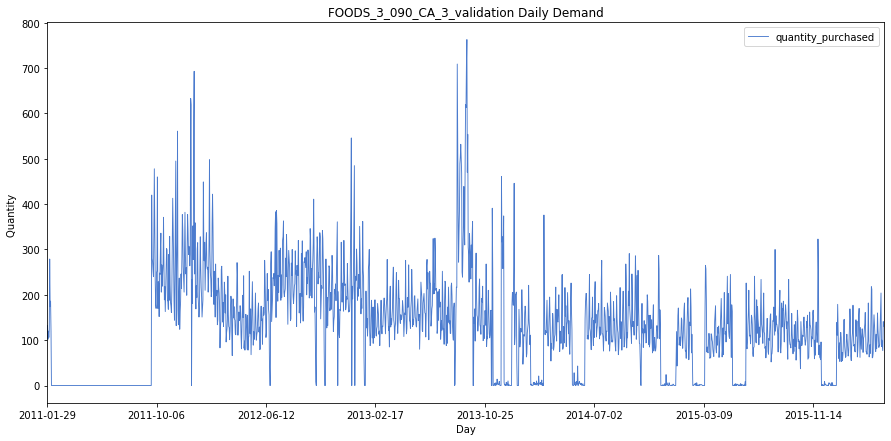

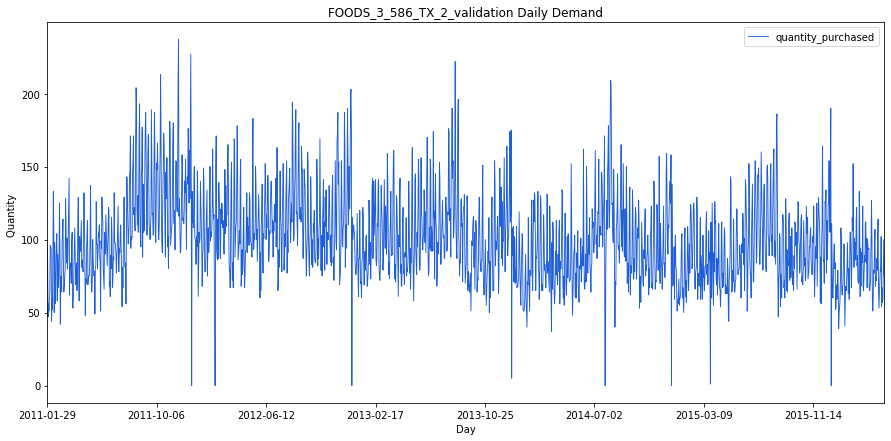

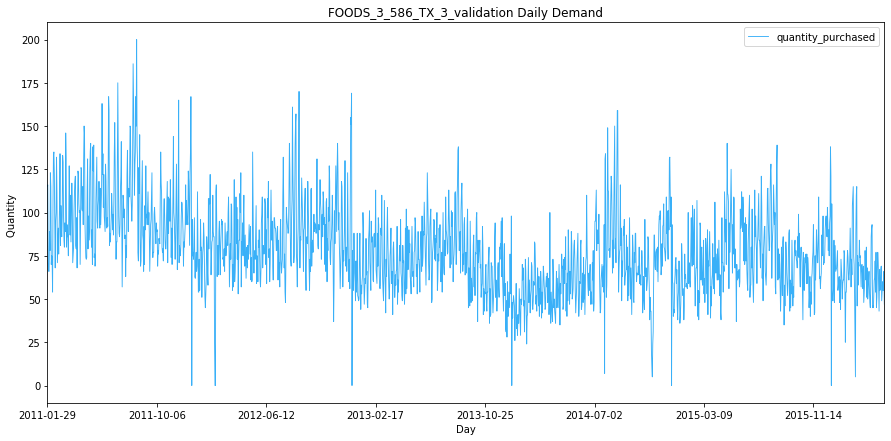

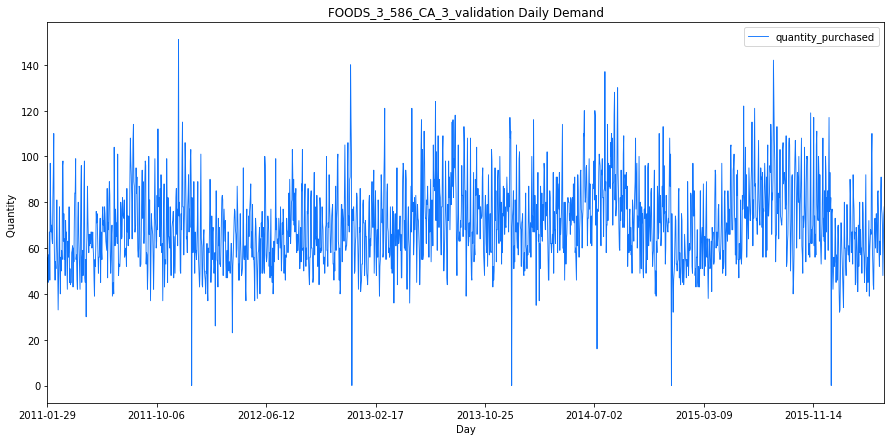

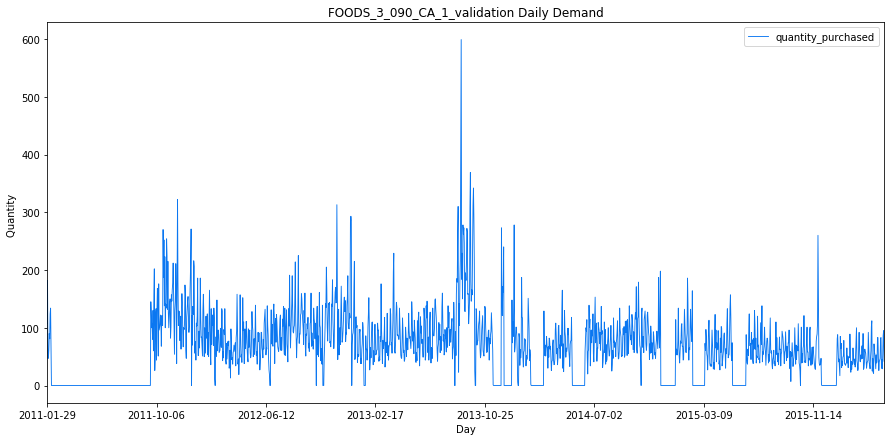

...

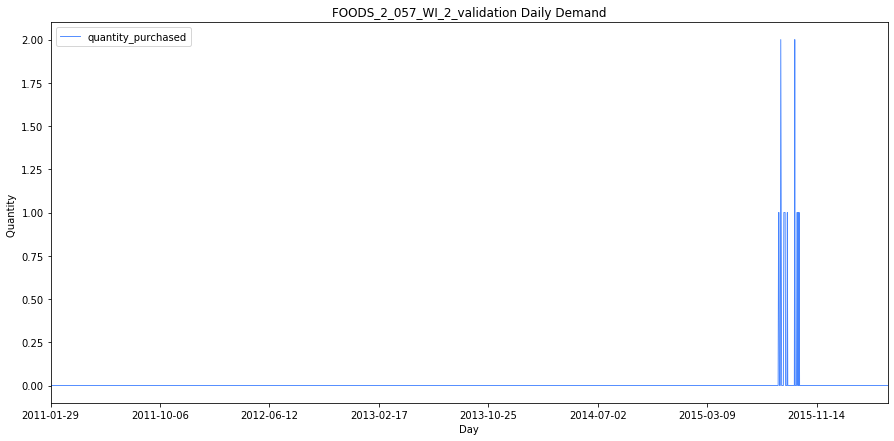

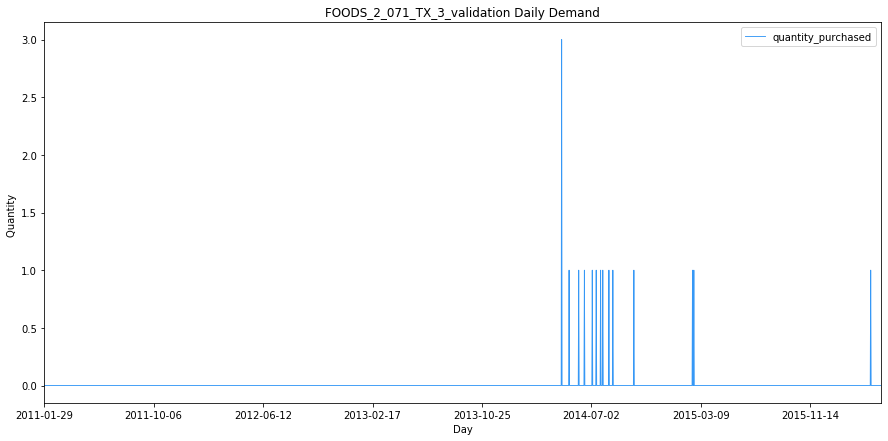

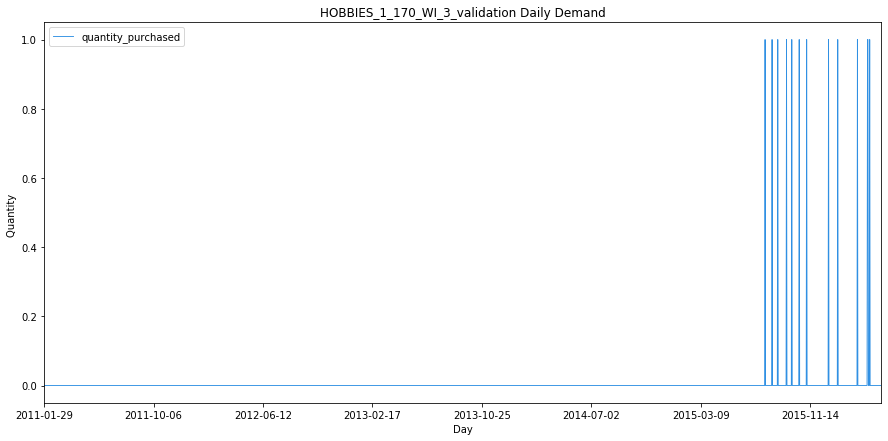

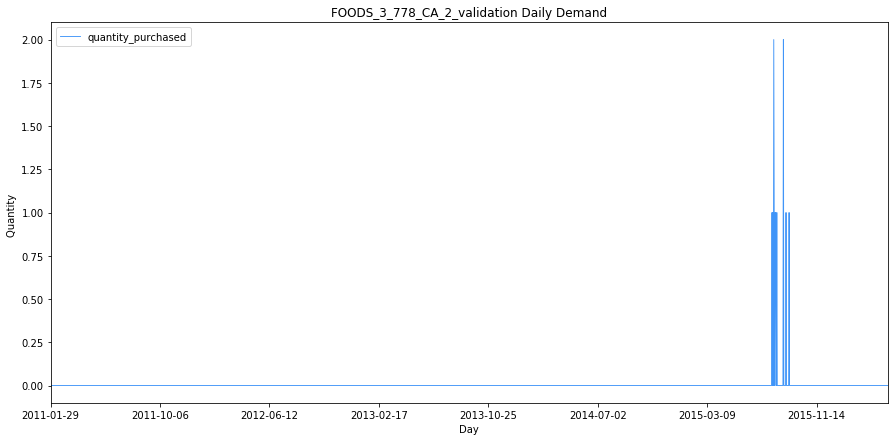

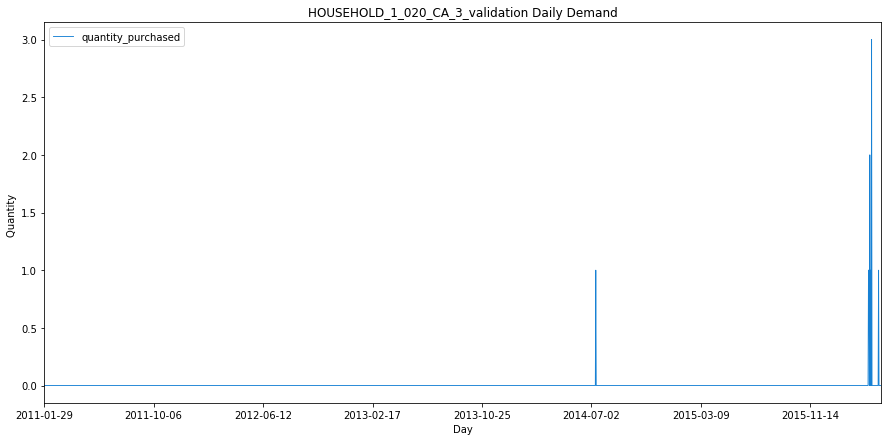

In [21]:
for product in top_10_products:
    visualize_by_day(product)
for product in bottom_10_products:
    visualize_by_day(product)

We can easily see that the top 10 products behave completely differently from the bottom 10 products. While the top 10 behave like your more typical time series, the bottom 10 have sporadic demand, mainly consisting of zeros with the occasional sale.

Obviously we are looking at the two extreme ends of product demand, but we'll still need to consider this when building our model.

I'm not sure if it's kosher, but perhaps I might even want to tune a model products that have a sale on some minimum number of days and then tune a model for the products that barely have any demand.

Anyway... we'll see.

# Top 10 Products - Demand Over Time (by week)

In [17]:
def visualize_by_week(item):
    # Create a data frame with only the item we are trying to look at sales for
    df_just_1 = df.loc[df['id'] == item]
    df_just_1.drop(['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], inplace = True, axis = 1)
    
    # 'Melt' our data frame
    melted_df = pd.melt(df_just_1, id_vars = 'id', var_name = 'date', value_name = 'quantity_purchased')
    melted_df.drop(['id'], axis = 1, inplace = True)
    
    # Merge data frame with calendar data frame in order to get actual dates
    together_now = pd.merge(melted_df, df_cal, left_on = 'date', right_on = 'd', how = 'inner')
    together_now.drop(['date_x', 'date_y', 'weekday', 'wday', 'month', 'year', 'd', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis = 1, inplace = True)
    together_now.set_index('wm_yr_wk', inplace = True)
    by_week = together_now.groupby('wm_yr_wk').sum()
    
    # Plot our data
    by_week.plot(title = '{} Weekly Demand'.format(item), figsize = (15, 7), linewidth = .9, color = (random.uniform(0, .3), random.uniform(.3, .7), random.uniform(.7, 1)))
    plt.xlabel('Week')
    plt.ylabel('Quantity ')

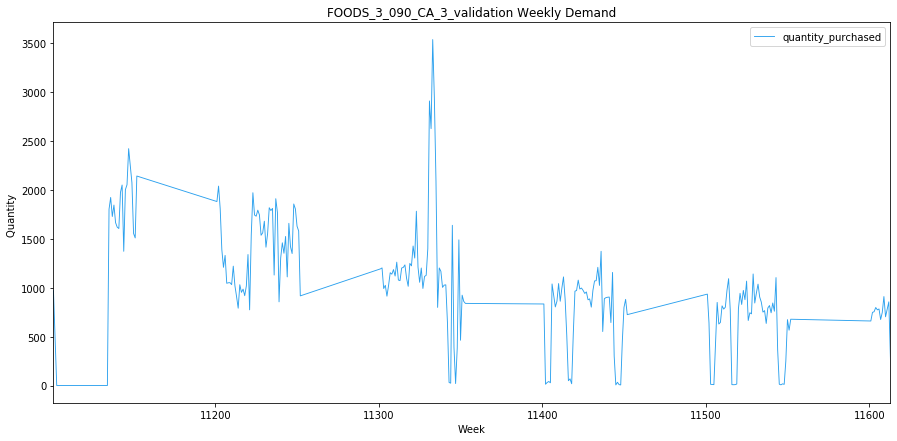

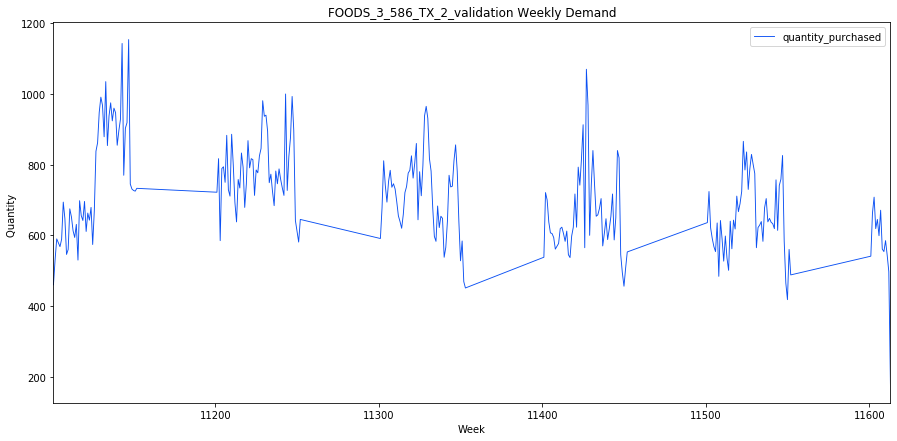

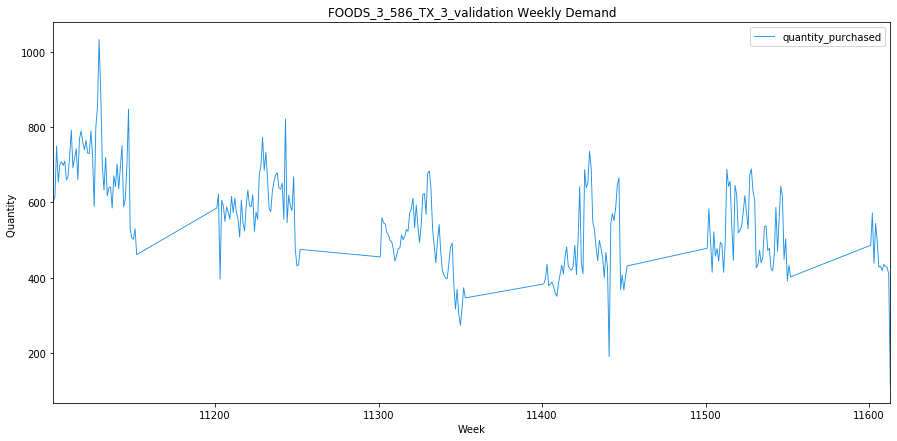

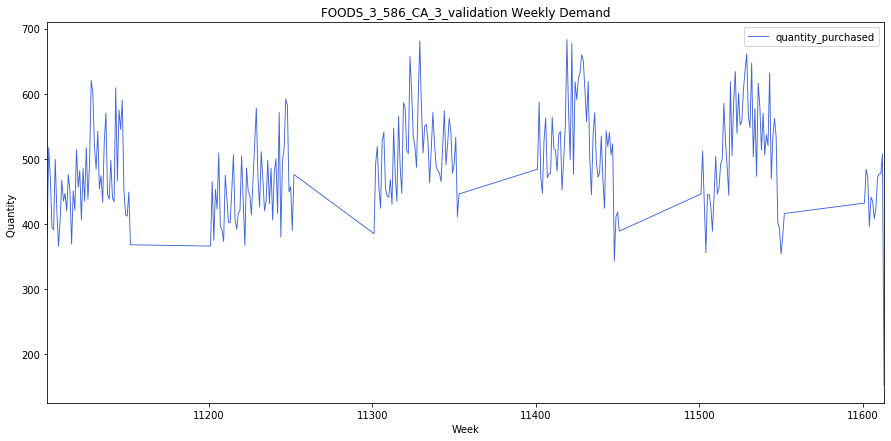

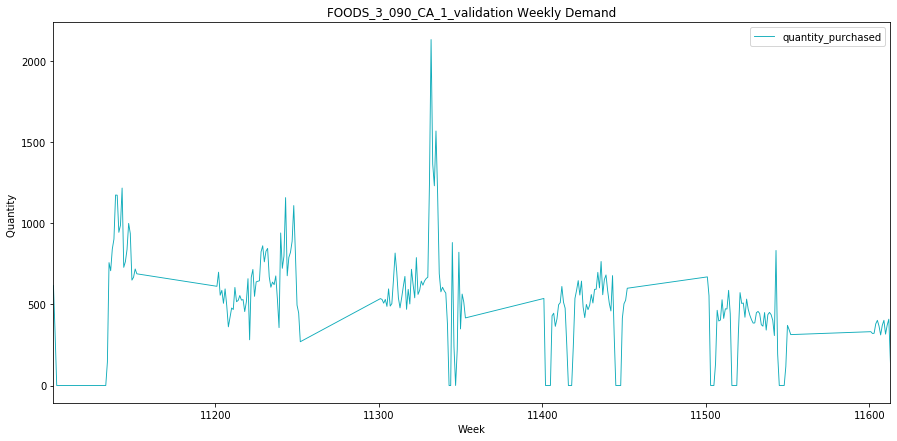

...

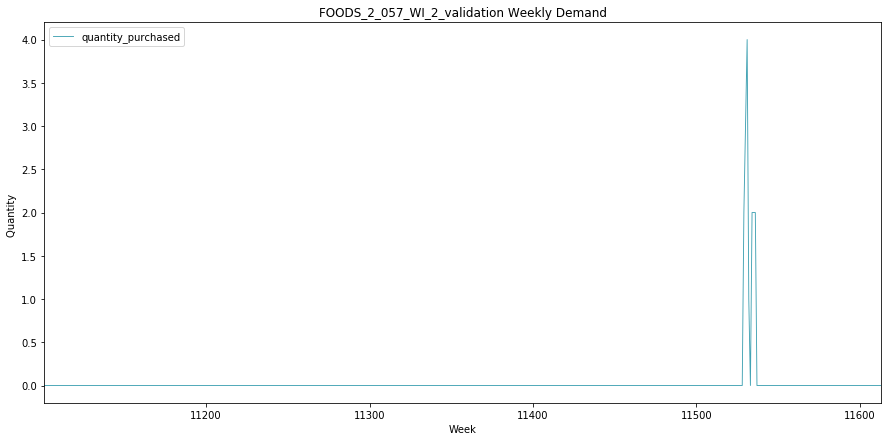

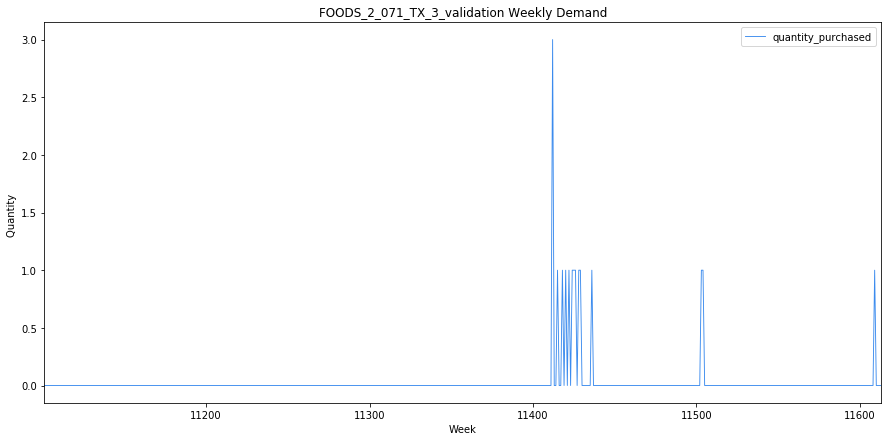

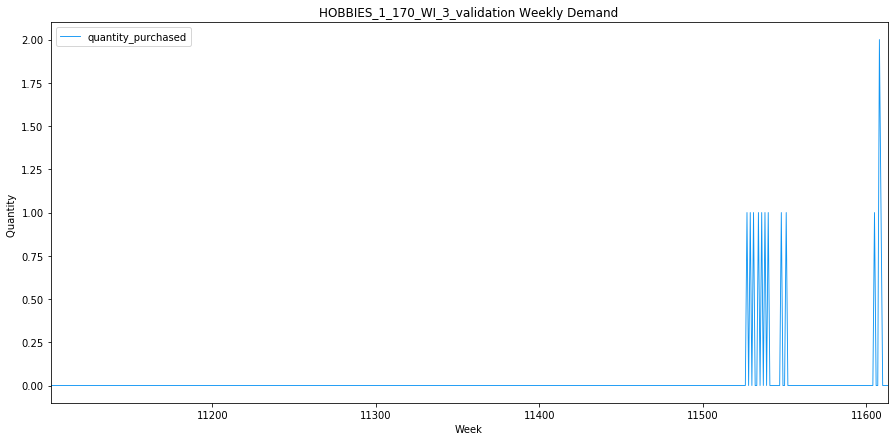

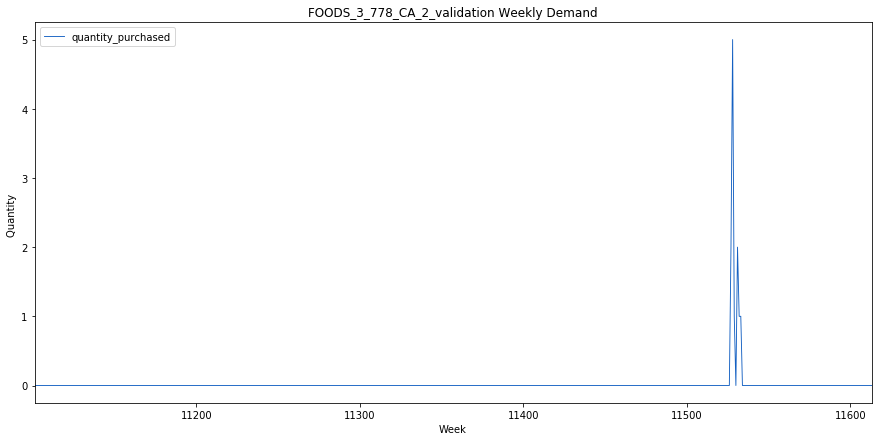

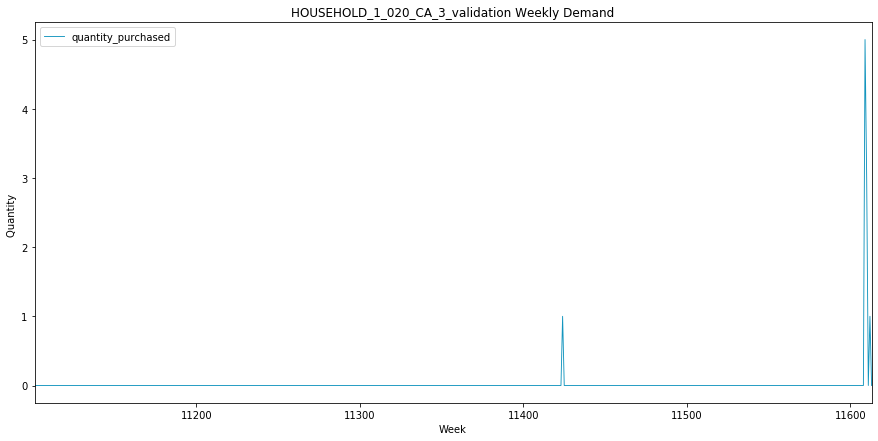

In [18]:
for product in top_10_products:
    visualize_by_week(product)
for product in bottom_10_products:
    visualize_by_week(product)

Sort of the same story as above. Even aggregated at the weekly level, the bottom 10 products aren't able to produce any sort of discernible pattern.

# Top 10 Products - Demand Over Time (by year)

In [22]:
def visualize_by_year(item):
    # Create a data frame with only the item we are trying to look at sales for
    df_just_1 = df.loc[df['id'] == item]
    df_just_1.drop(['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], inplace = True, axis = 1)
    
    # 'Melt' our data frame
    melted_df = pd.melt(df_just_1, id_vars = 'id', var_name = 'date', value_name = 'quantity_purchased')
    melted_df.drop(['id'], axis = 1, inplace = True)
    
    # Merge data frame with calendar data frame in order to get actual dates
    together_now = pd.merge(melted_df, df_cal, left_on = 'date', right_on = 'd', how = 'inner')
    together_now.drop(['date_x', 'date_y', 'weekday', 'wday', 'month', 'wm_yr_wk', 'd', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis = 1, inplace = True)
    together_now.set_index('year', inplace = True)
    by_year = together_now.groupby('year').sum()
    
    # Plot our data
    by_year.plot(title = '{} Yearly Demand'.format(item), figsize = (15, 7), linewidth = .9, color = (random.uniform(0, .3), random.uniform(.3, .7), random.uniform(.7, 1)))
    plt.xlabel('Year')
    plt.ylabel('Quantity ')

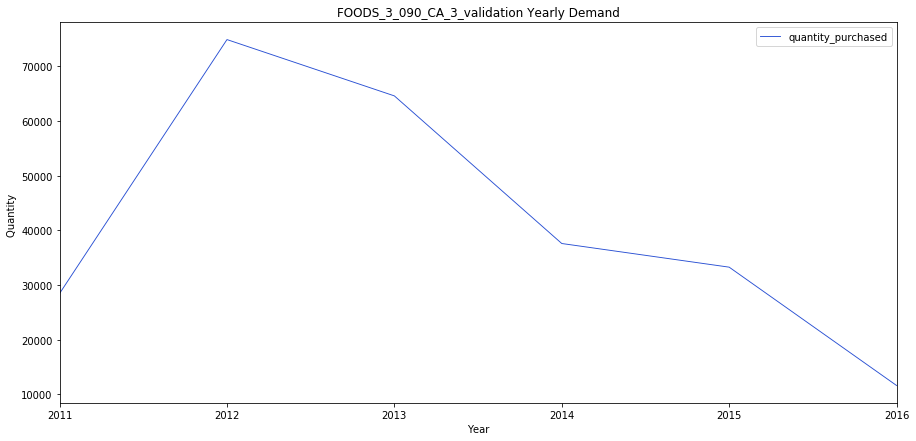

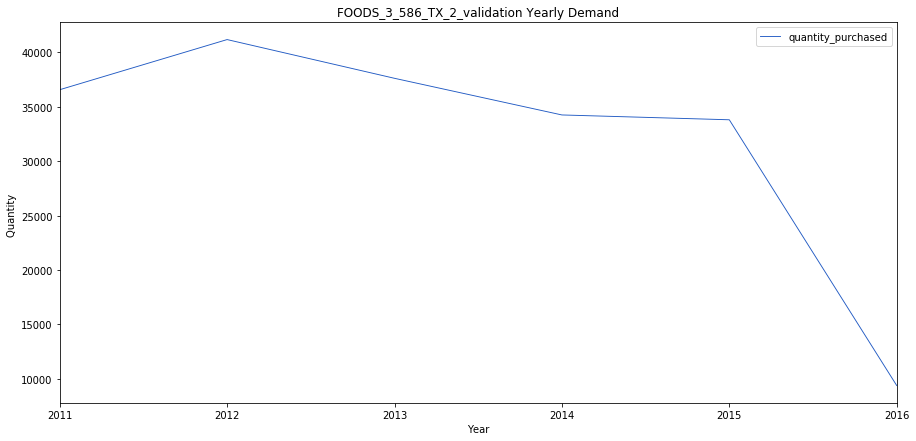

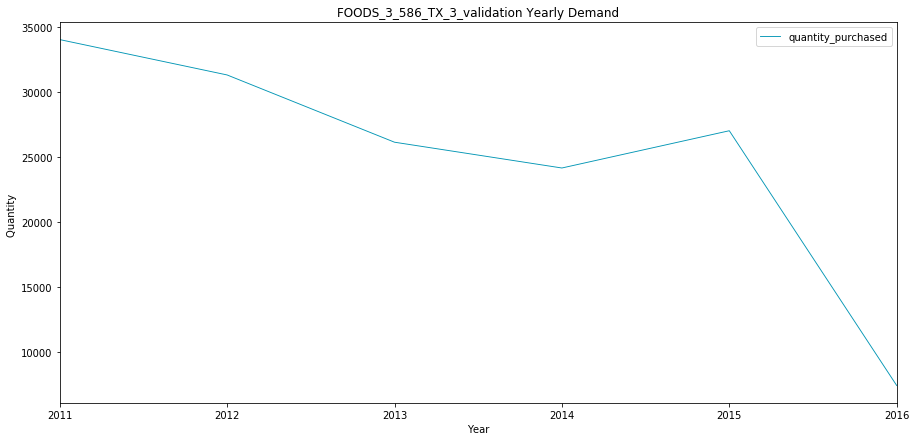

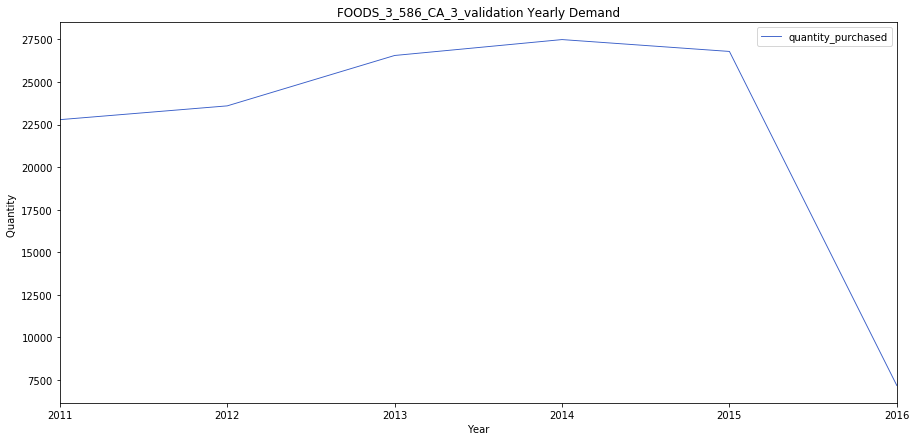

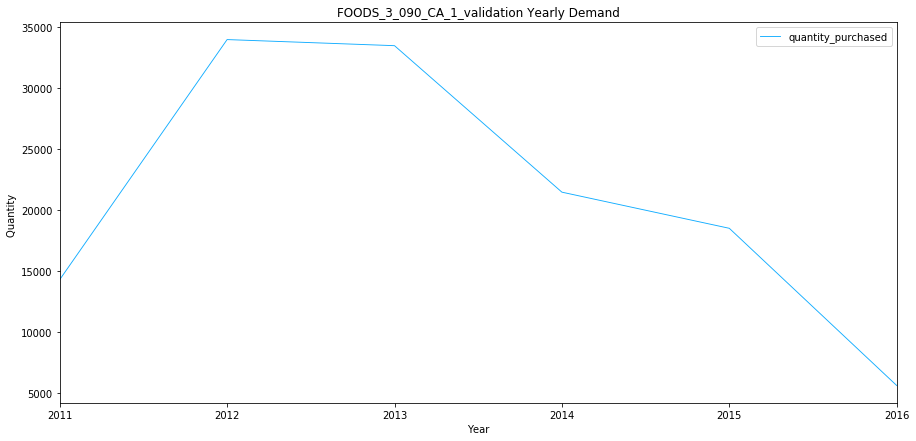

...

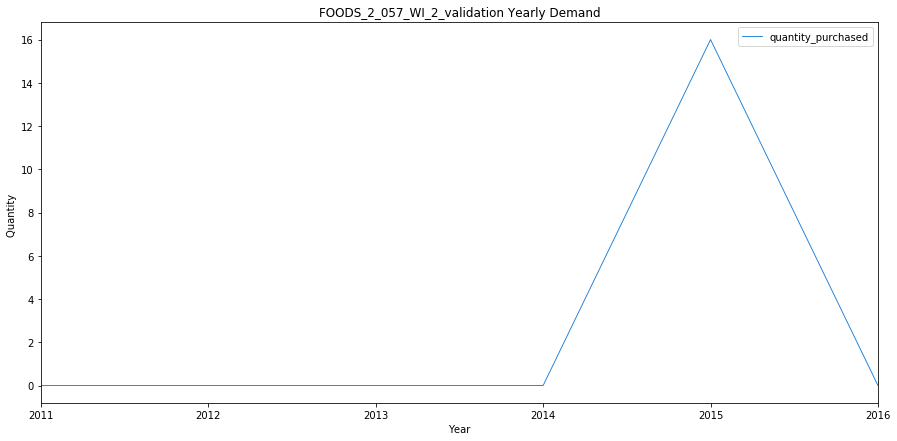

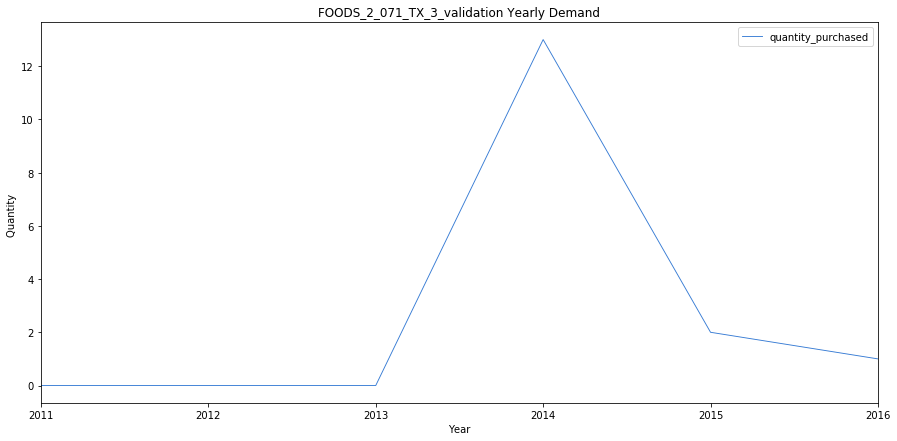

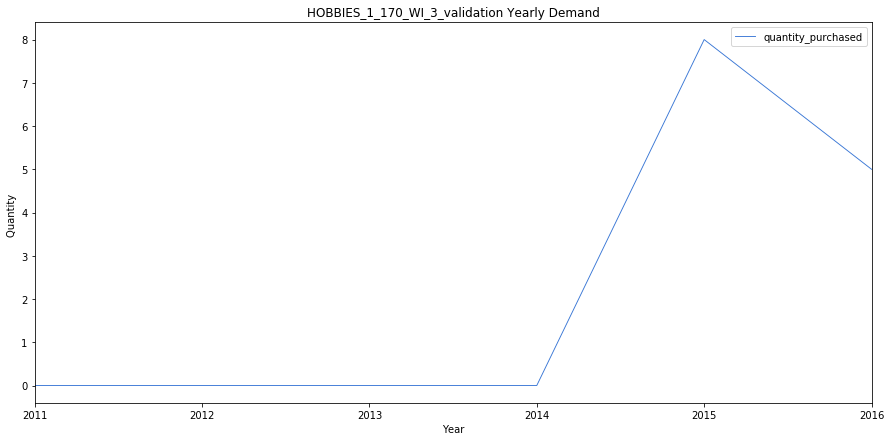

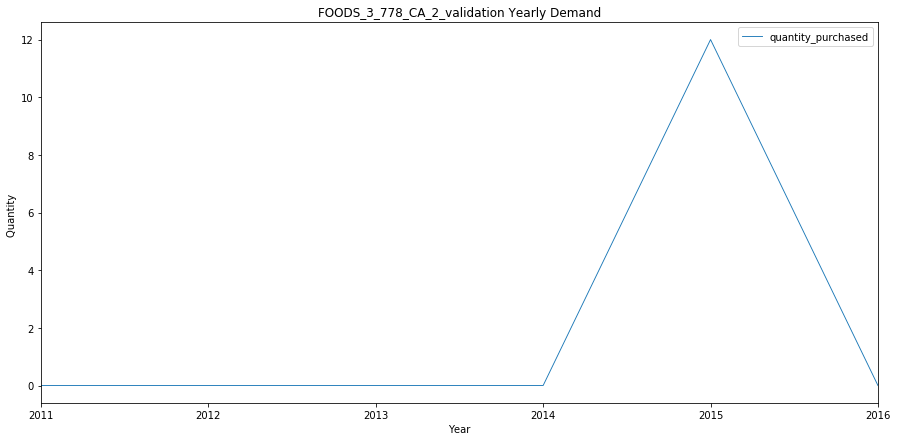

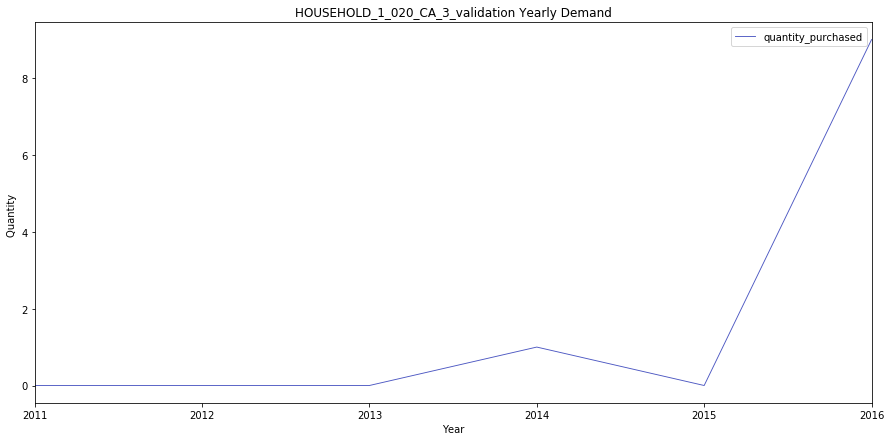

In [23]:
for product in top_10_products:
    visualize_by_year(product)
for product in bottom_10_products:
    visualize_by_year(product)

# Two interesting things to note:
1. For the top 10 products, almost every single one steadily and rapidly declines over 2015. After taking a closer look at the data, we can see that we have complete data for years 2012-2015, almost complete data for 2011 (337/365 days), but we only have 115/365 data points for 2016, which explains our consistent decline.

    I'm not really going to do anything about it at this the moment. Ultimately we're going to be predicting demand at the 'day' level.


2. For the bottom 10 products, there will be years where the product isn't sold. This most likely indicates a time period where that store was not carrying that item. Again, perhaps this is something that I'll have to deal wihth separately, but also perhaps these cases will be taken care of by my model. We will see.

In [27]:
def price_and_demand(item):
    df_just_1 = df.loc[df['id'] == item]
    df_just_1.drop(['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], inplace = True, axis = 1)
    
    # 'Melt' our data frame
    melted_df = pd.melt(df_just_1, id_vars = 'id', var_name = 'date', value_name = 'quantity_purchased')
    melted_df.drop(['id'], axis = 1, inplace = True)
    
    # Merge data frame with calendar data frame in order to get actual dates
    together_now = pd.merge(melted_df, df_cal, left_on = 'date', right_on = 'd', how = 'inner')
    together_now.drop(['date_x', 'date_y', 'weekday', 'wday', 'month', 'year', 'd', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis = 1, inplace = True)
    together_now.set_index('wm_yr_wk', inplace = True)

    # Create a dataframe with the price information for the item we are trying to plot
    df_prices_just_1 = df_prices.loc[df_prices['unique'] == item]
    df_prices_just_1.drop(['store_id', 'item_id', 'unique'], axis = 1, inplace = True)
    df_prices_just_1.set_index('wm_yr_wk', inplace = True)
    #
    final_final = pd.merge(together_now, df_prices_just_1, left_on = 'wm_yr_wk', right_on = 'wm_yr_wk', how = 'inner' )
    by_week = final_final.groupby('wm_yr_wk').sum()
        
    # Plot our data
    fig, ax1 = plt.subplots(figsize = (15, 7))

    color = (.33, .03, .98)
    ax1.set_xlabel('Week')
    ax1.set_title('Price & Demand by Week for {}'.format(item))
    ax1.set_ylabel('Demand', color=color)
    ax1.plot(by_week['quantity_purchased'], color=color, linewidth = .9)
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  

    color = (.67, .97, .02)
    ax2.set_ylabel('Price', color=color)  
    ax2.plot(by_week['sell_price'], color=color, linewidth = .9)
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  
    plt.show()

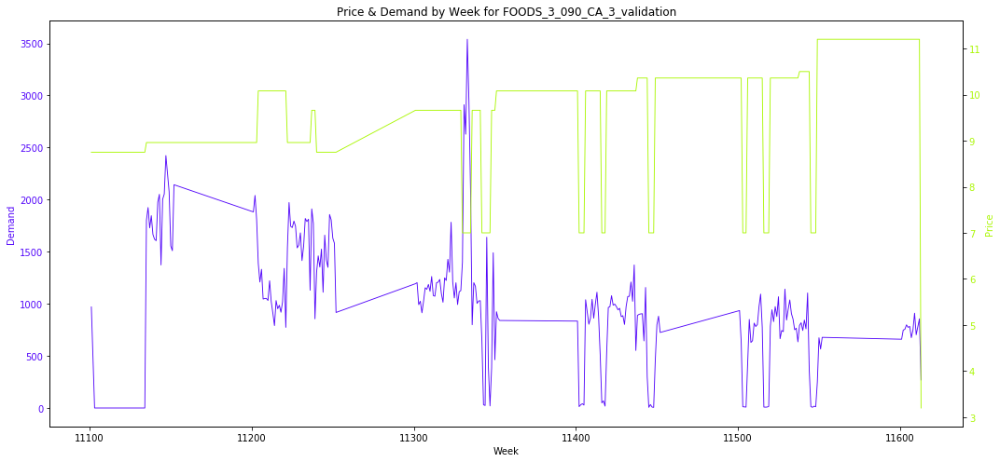

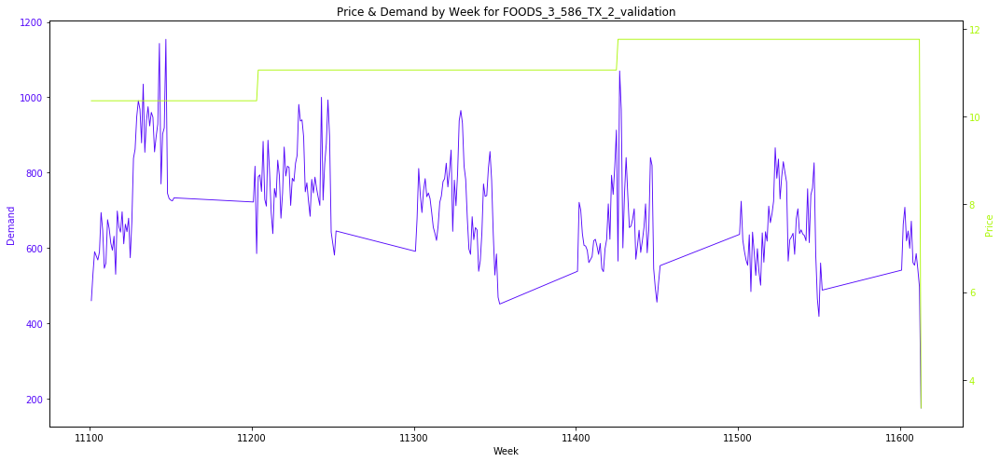

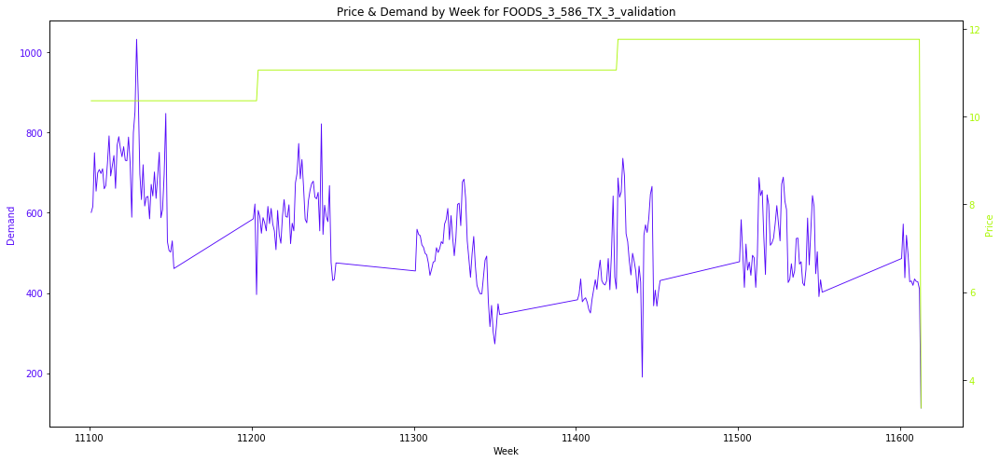

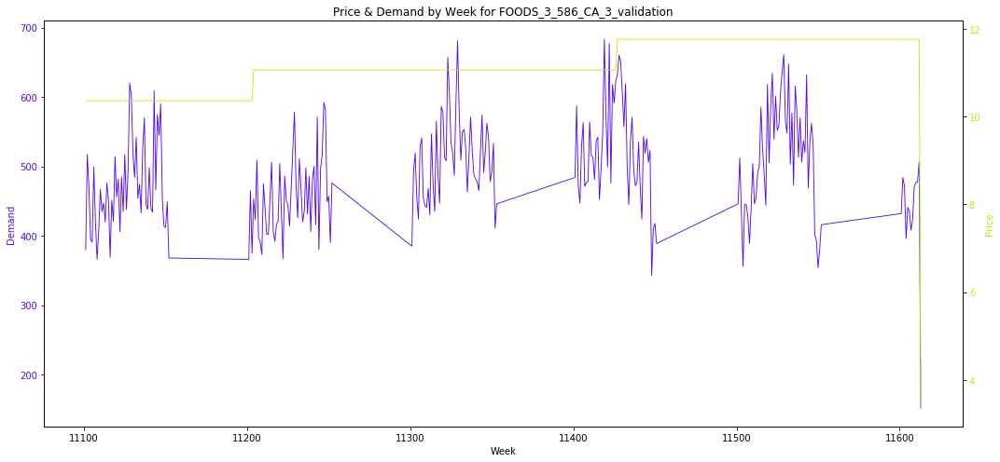

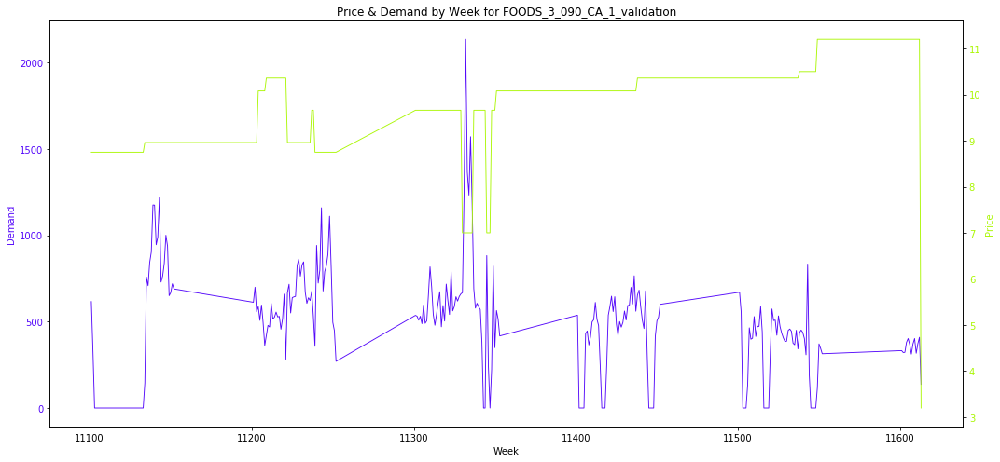

...

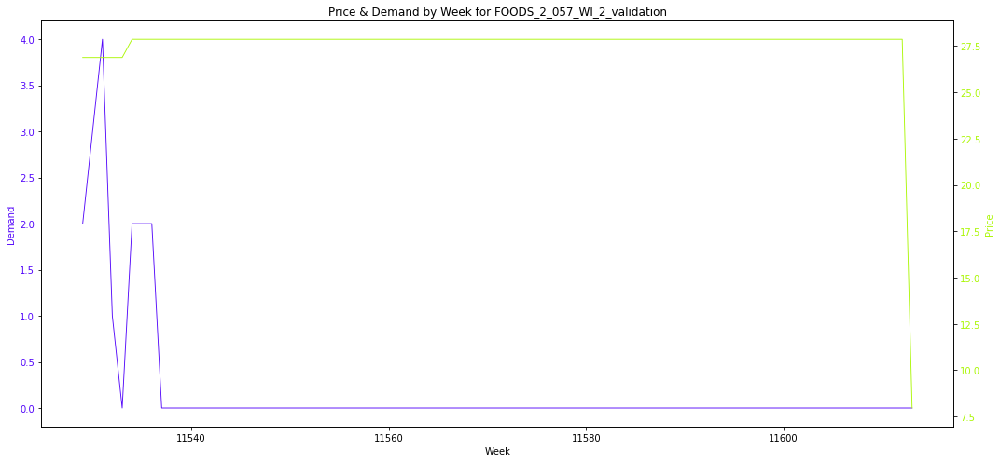

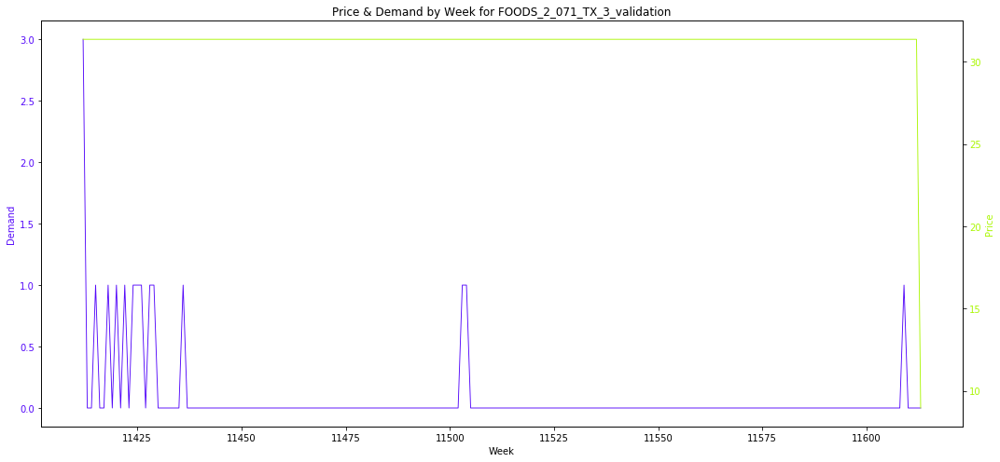

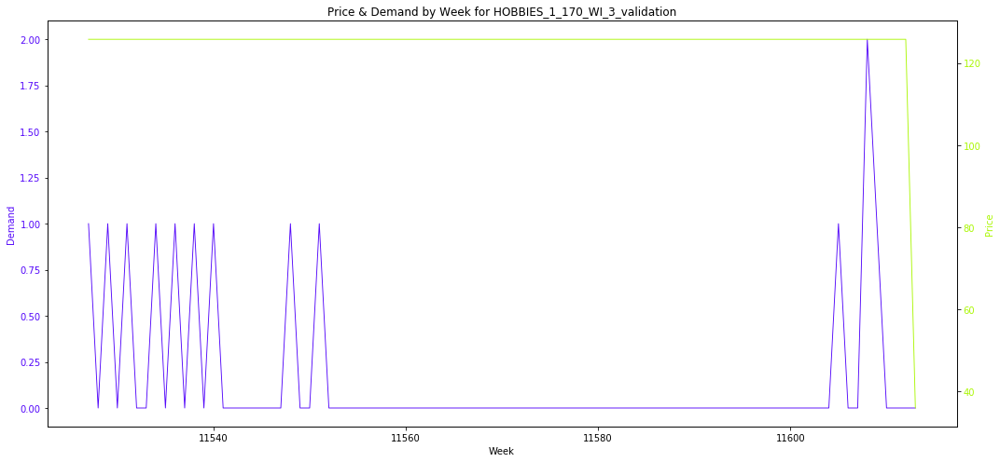

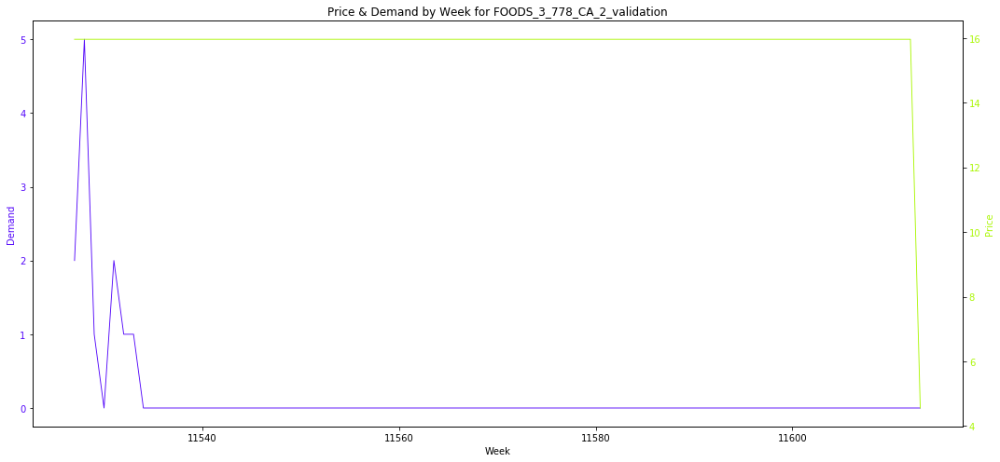

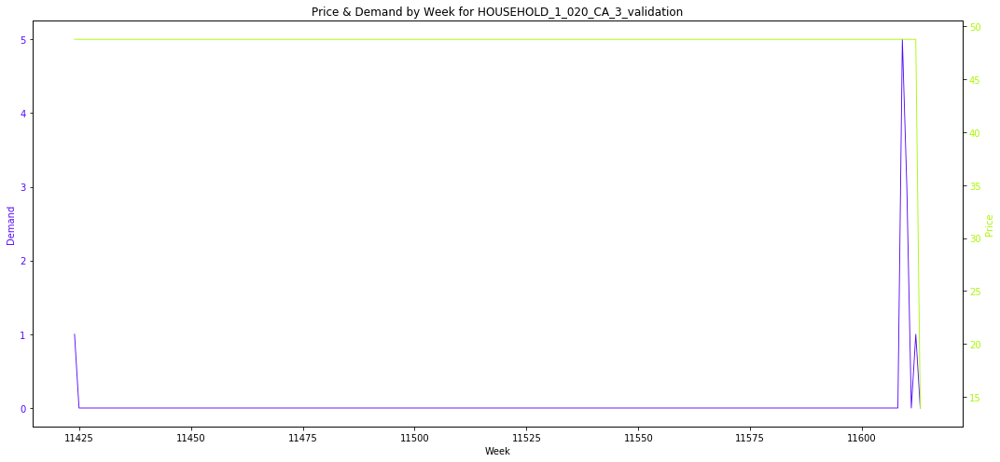

In [28]:
for product in top_10_products:
    price_and_demand(product)
for product in bottom_10_products:
    price_and_demand(product)


For the top 10 products, we see more movement with the price. In general, we are seeing a spike in demand whenever the price is dropped, which makes sense. Price is probably going to be pretty useful in helping us to determine demand.

For the bottom 10 products however, we weren't able to learn as much. The price essentially stayed constant and appeared to have no real impact on demand.

# Demand by day of the week

In [29]:
def day_of_week(item):
    # Create a data frame with only the item we are trying to look at sales for
    df_just_1 = df.loc[df['id'] == item]
    df_just_1.drop(['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], inplace = True, axis = 1)
    
    # 'Melt' our data frame
    melted_df = pd.melt(df_just_1, id_vars = 'id', var_name = 'date', value_name = 'quantity_purchased')
    melted_df.drop(['id'], axis = 1, inplace = True)
    
    # Merge data frame with calendar data frame in order to get actual dates
    together_now = pd.merge(melted_df, df_cal, left_on = 'date', right_on = 'd', how = 'inner')
    together_now.drop(['date_x', 'date_y', 'wm_yr_wk', 'wday', 'month', 'year', 'd', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis = 1, inplace = True)
    together_now.set_index('weekday', inplace = True)
    by_week = together_now.groupby('weekday').mean()
    
    # Plot our data
    by_week.plot(kind = 'bar',title = 'Average Demand by Weekday for {}'.format(item), figsize = (15, 7), linewidth = .9, color = (random.uniform(0, .3), random.uniform(.3, .7), random.uniform(.7, 1)))
    plt.xlabel('Day')
    plt.ylabel('Quantity')

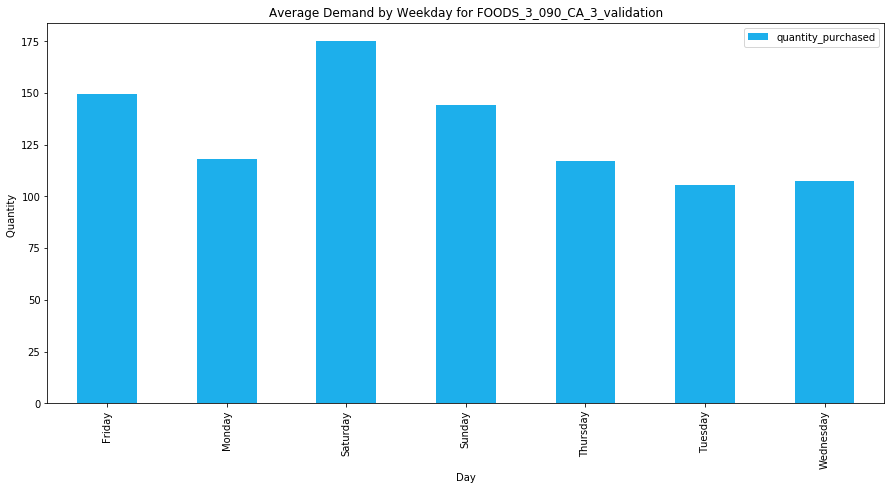

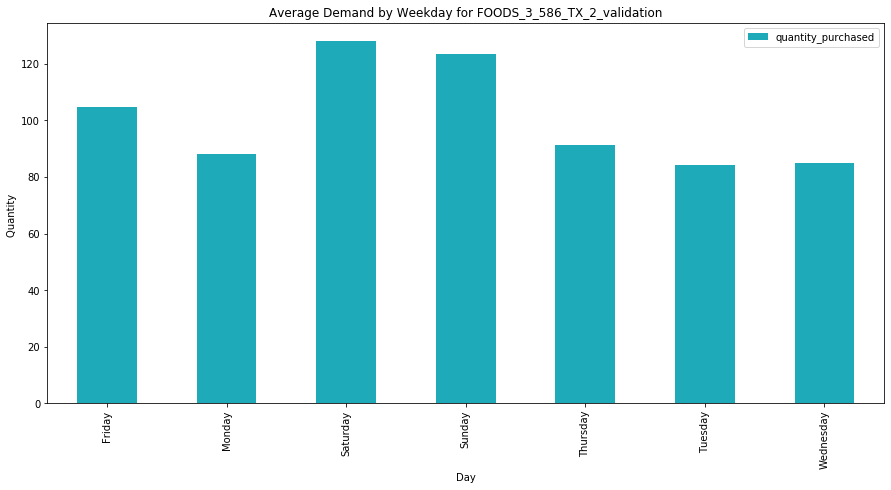

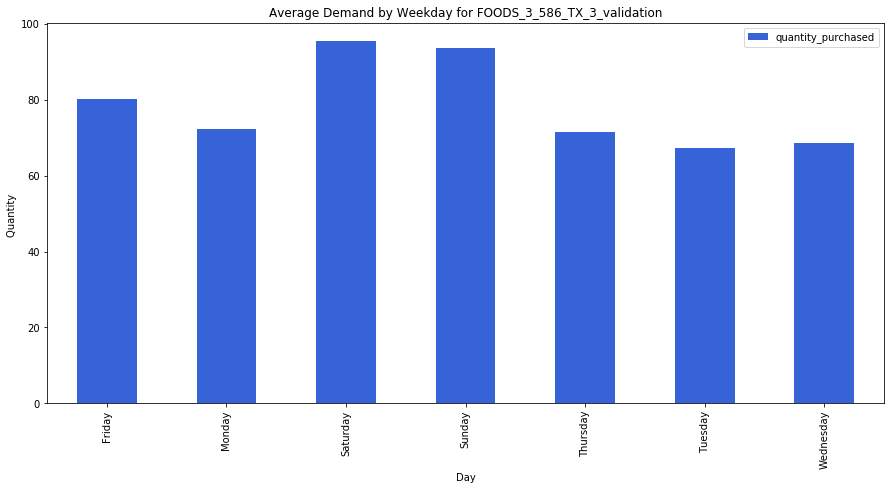

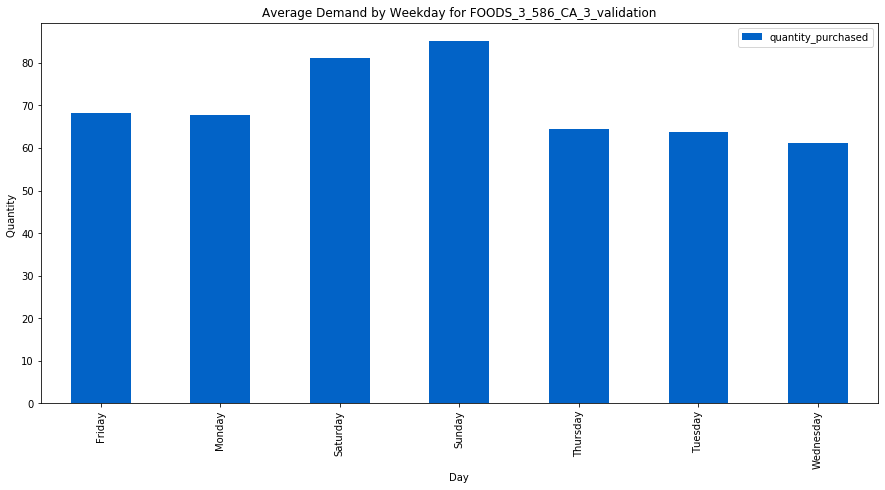

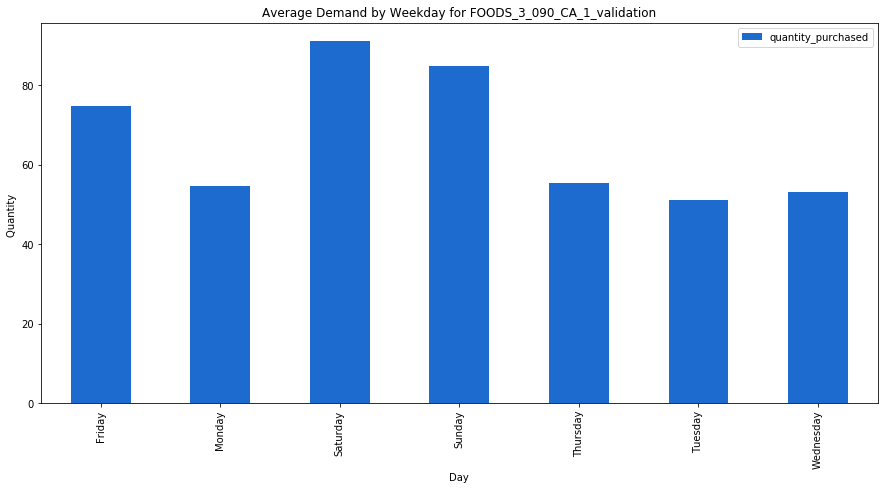

...

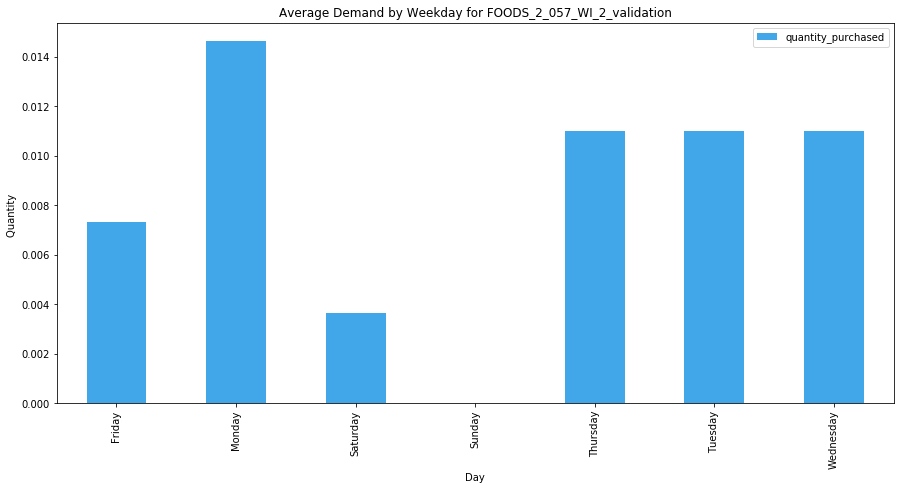

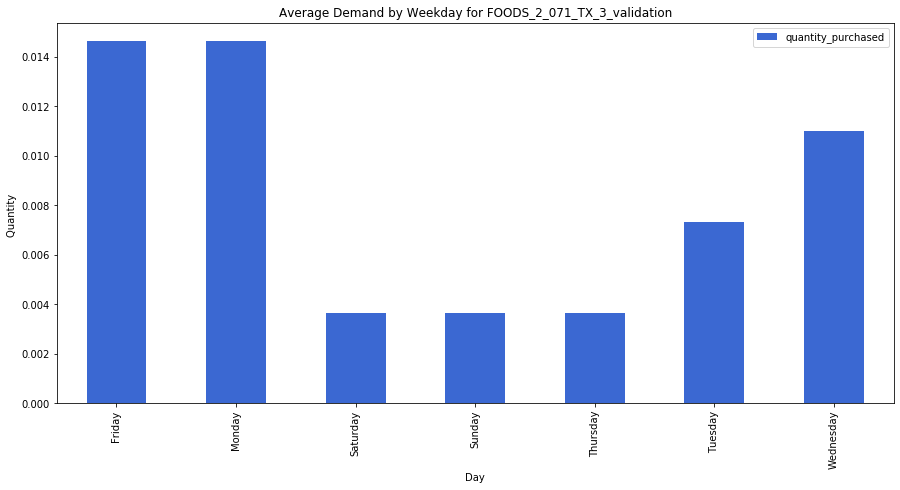

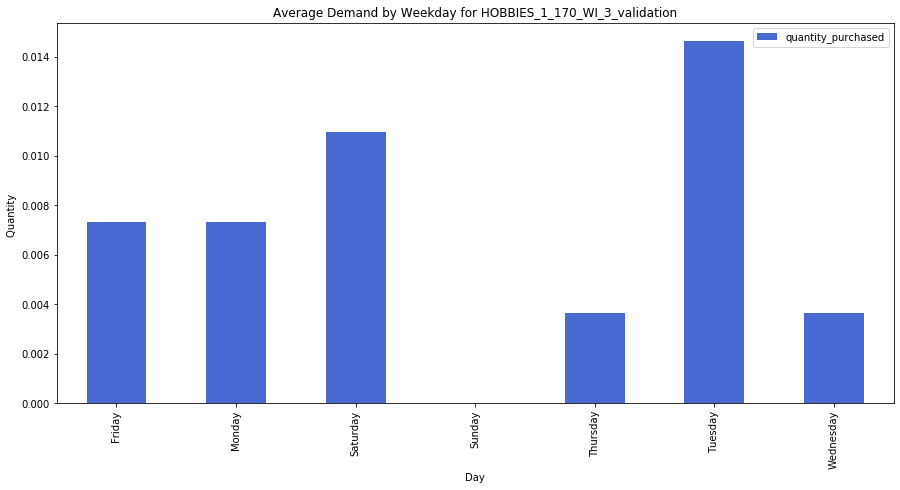

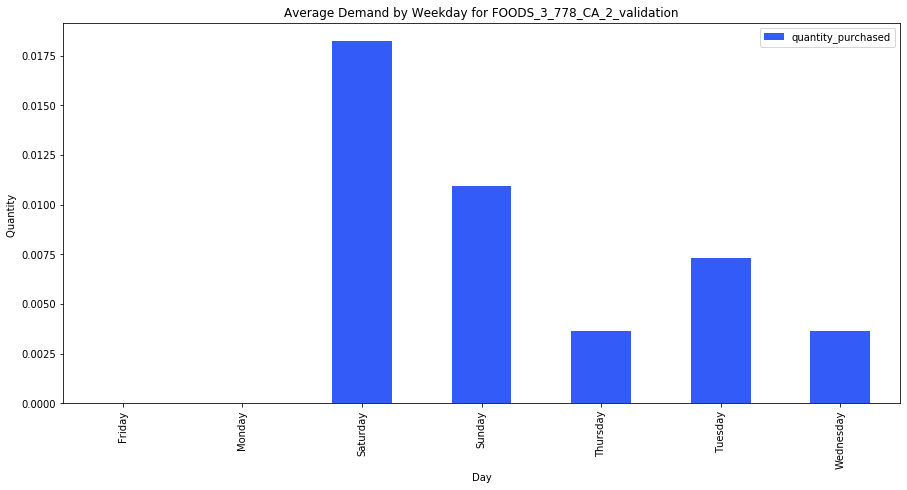

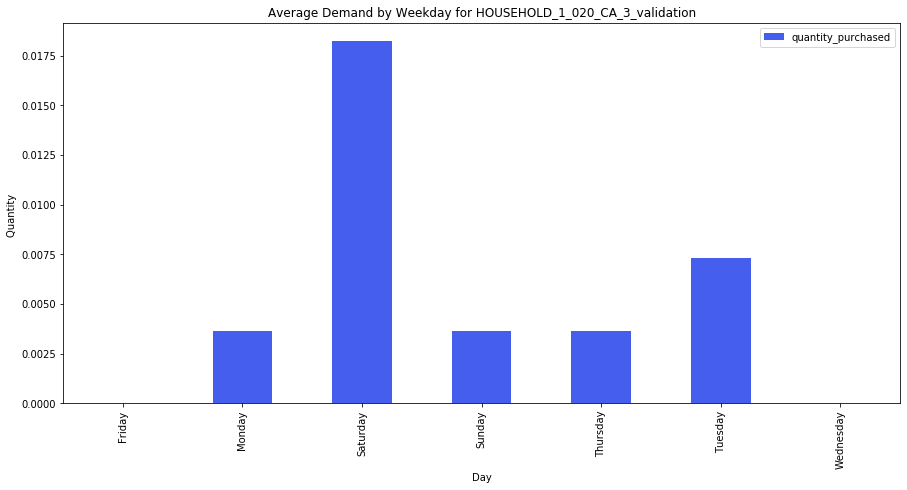

In [30]:
for product in top_10_products:
    day_of_week(product)
for product in bottom_10_products:
    day_of_week(product)

In [24]:
def box_of_week(item):
    # Create a data frame with only the item we are trying to look at sales for
    df_just_1 = df.loc[df['id'] == item]
    df_just_1.drop(['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], inplace = True, axis = 1)
    
    # 'Melt' our data frame
    melted_df = pd.melt(df_just_1, id_vars = 'id', var_name = 'date', value_name = 'quantity_purchased')
    melted_df.drop(['id'], axis = 1, inplace = True)
    
    # Merge data frame with calendar data frame in order to get actual dates
    together_now = pd.merge(melted_df, df_cal, left_on = 'date', right_on = 'd', how = 'inner')
    together_now.drop(['date_x', 'date_y', 'wm_yr_wk', 'wday', 'month', 'year', 'd', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis = 1, inplace = True)
    together_now.set_index('weekday', inplace = True)
    #return(together_now)
    
    # Plot our data
    together_now.boxplot(by = 'weekday', figsize = (15, 7))
    plt.title('Demand by Weekday for {}'.format(item))
    plt.suptitle('')
    plt.xlabel('Day')
    plt.ylabel('Demand')

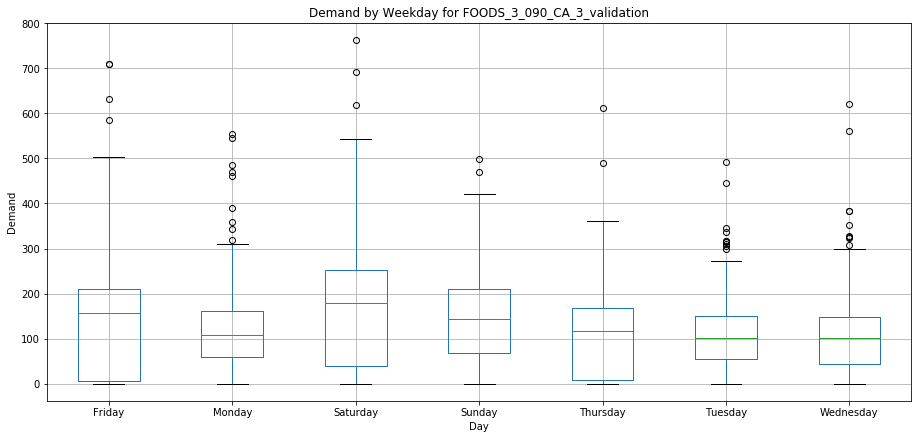

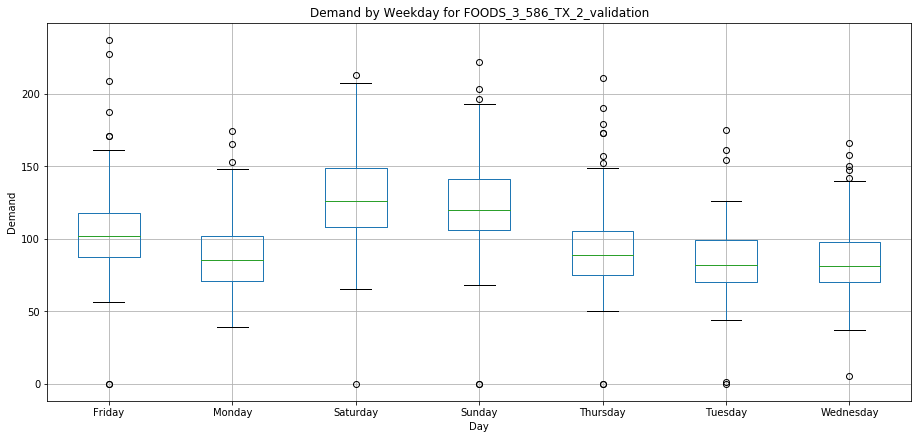

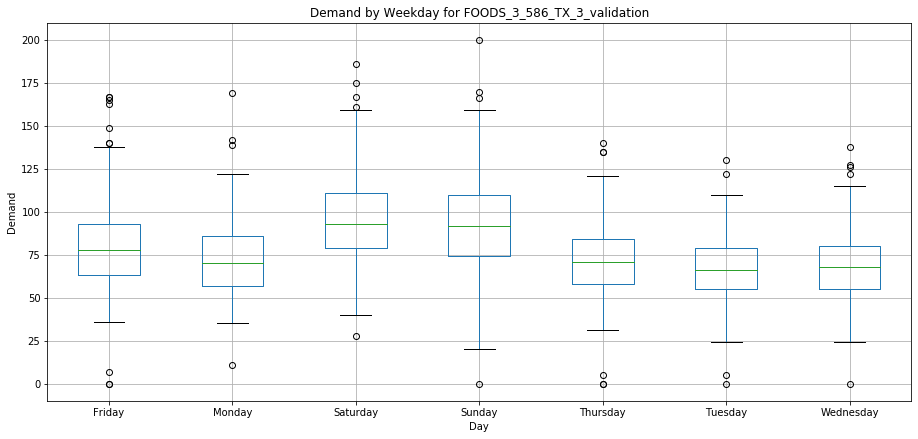

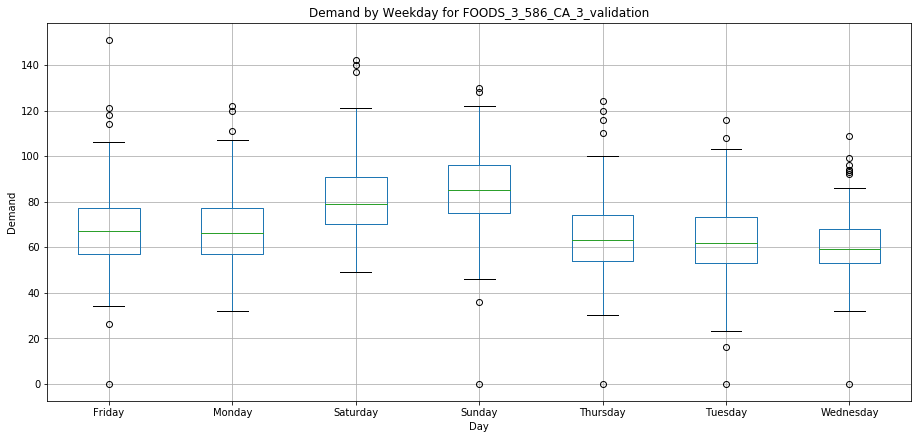

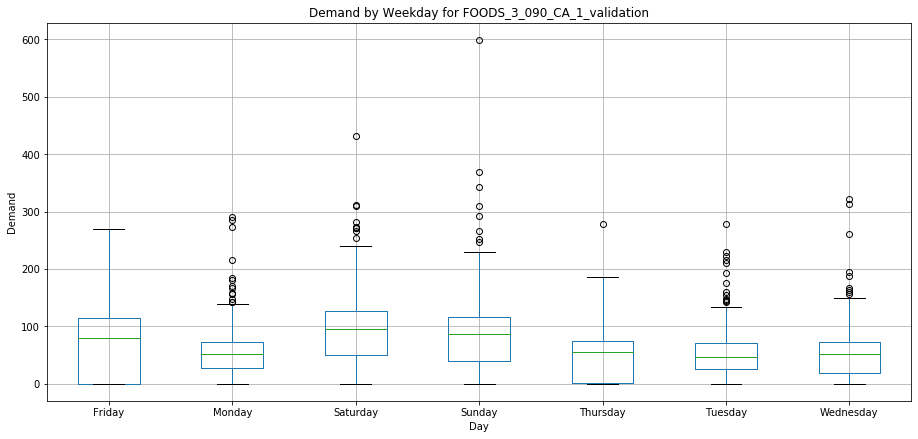

...

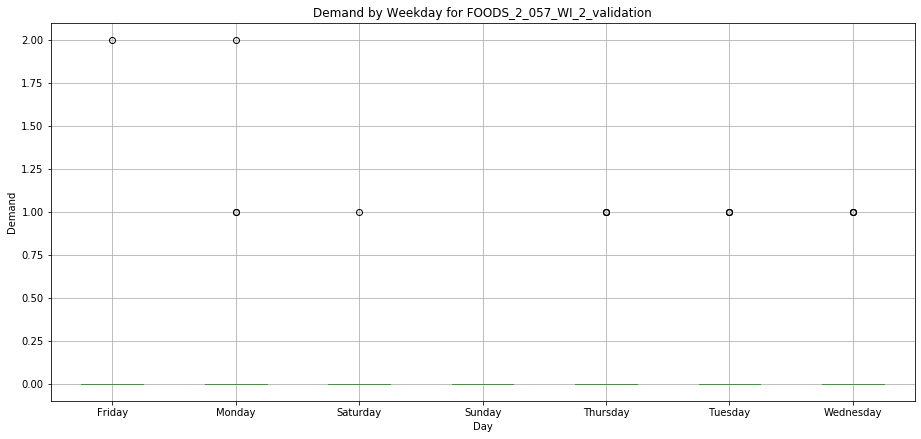

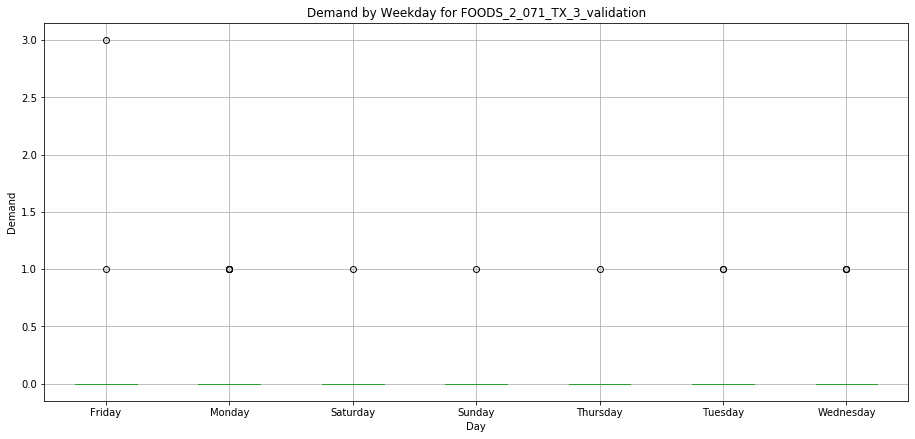

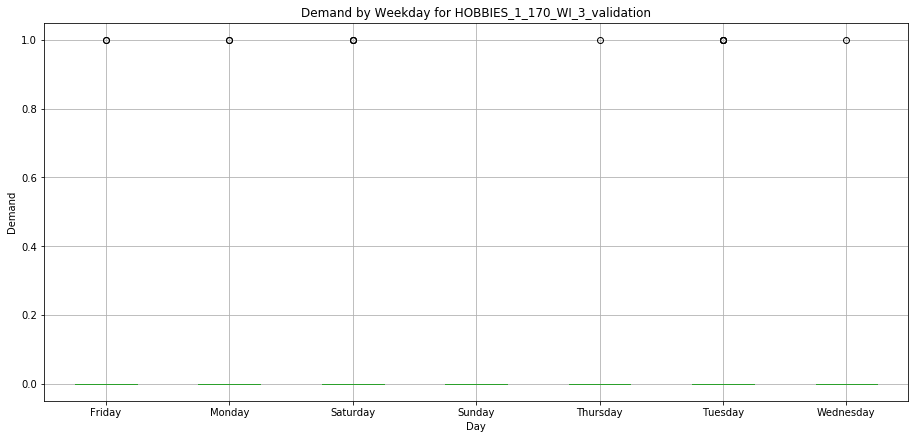

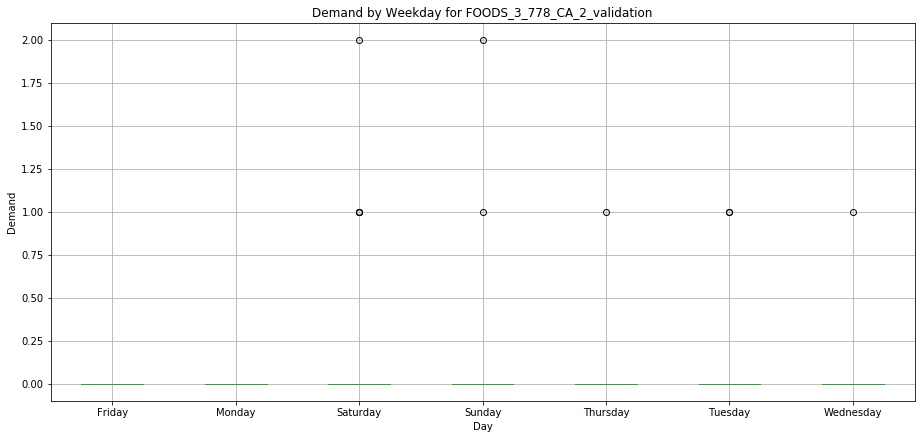

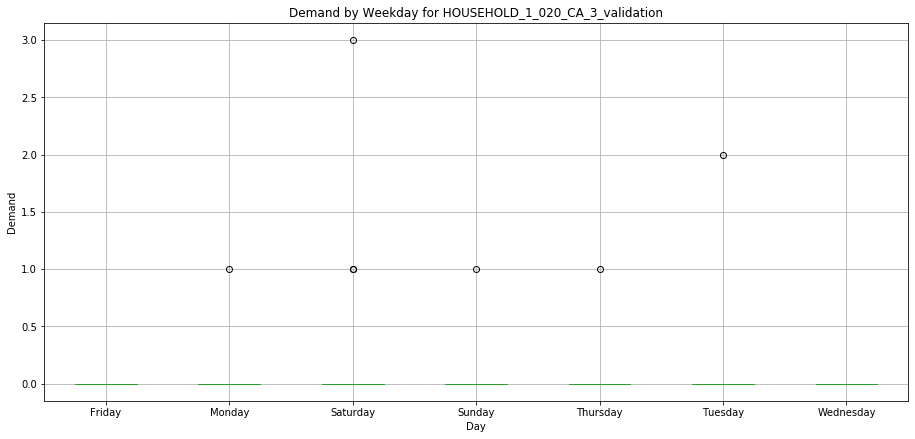

In [25]:
for product in top_10_products:
    box_of_week(product)
for product in bottom_10_products:
    box_of_week(product)

# Demand by Month of the Year

In [33]:
def month_of_year(item):
    # Create a data frame with only the item we are trying to look at sales for
    df_just_1 = df.loc[df['id'] == item]
    df_just_1.drop(['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], inplace = True, axis = 1)
    
    # 'Melt' our data frame
    melted_df = pd.melt(df_just_1, id_vars = 'id', var_name = 'date', value_name = 'quantity_purchased')
    melted_df.drop(['id'], axis = 1, inplace = True)
    
    # Merge data frame with calendar data frame in order to get actual dates
    together_now = pd.merge(melted_df, df_cal, left_on = 'date', right_on = 'd', how = 'inner')
    together_now.drop(['date_x', 'date_y', 'wm_yr_wk', 'wday', 'weekday', 'year', 'd', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis = 1, inplace = True)
    together_now.set_index('month', inplace = True)
    by_week = together_now.groupby('month').mean()
    
    # Plot our data
    by_week.plot(kind = 'bar',title = 'Average Demand by Month for {}'.format(item), figsize = (15, 7), linewidth = .9, color = (random.uniform(0, .3), random.uniform(.3, .7), random.uniform(.7, 1)))
    plt.xlabel('Month')
    plt.ylabel('Quantity ')

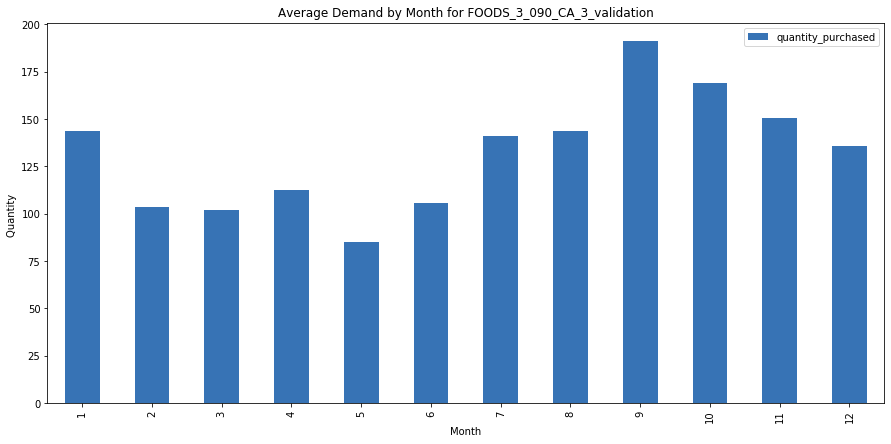

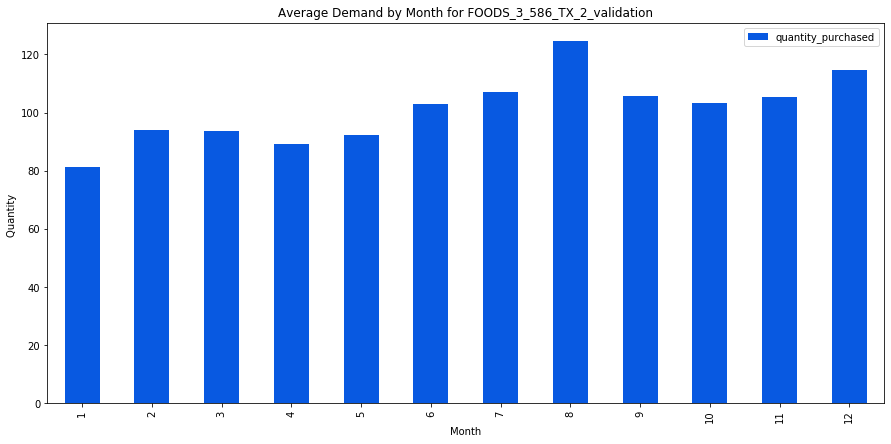

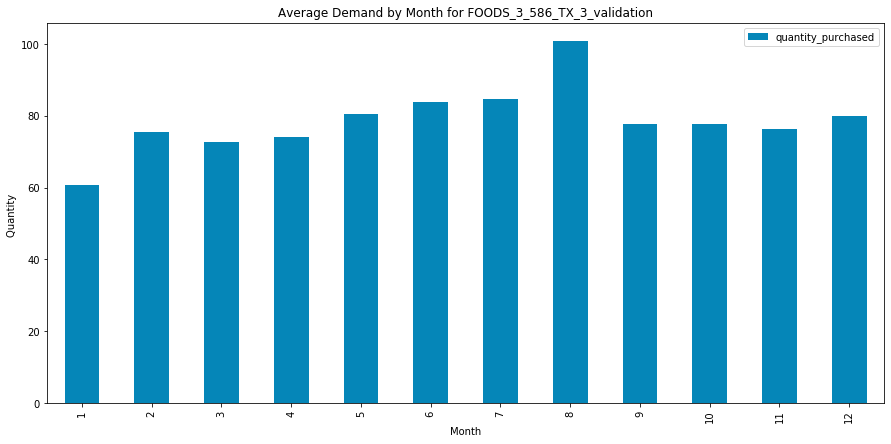

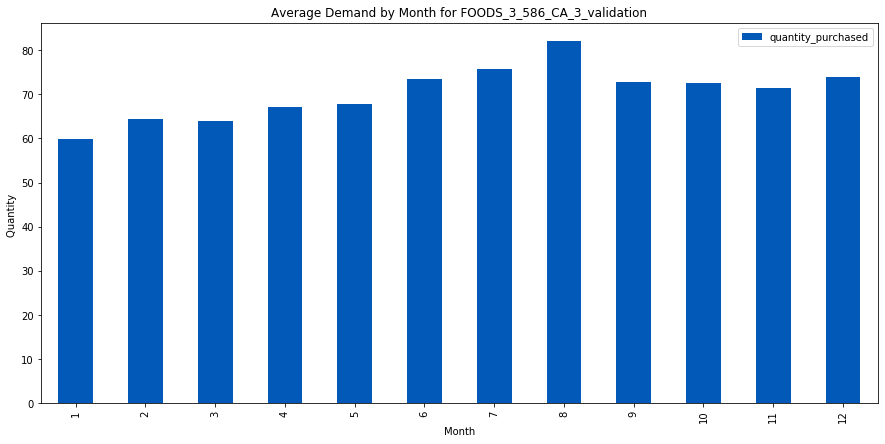

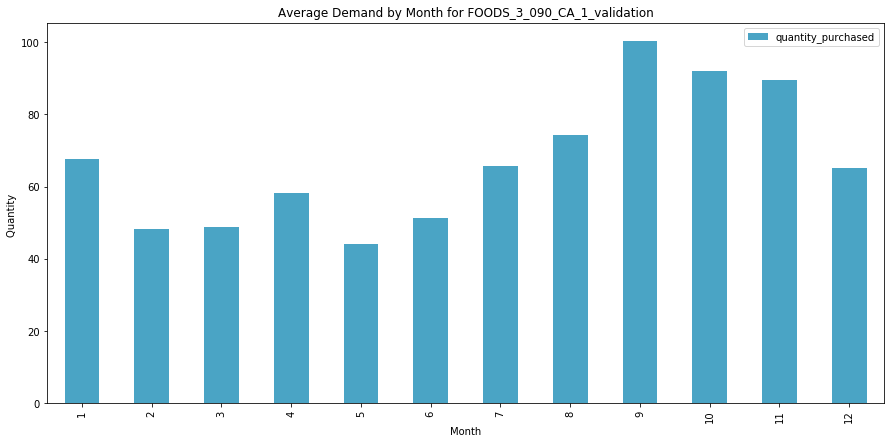

...

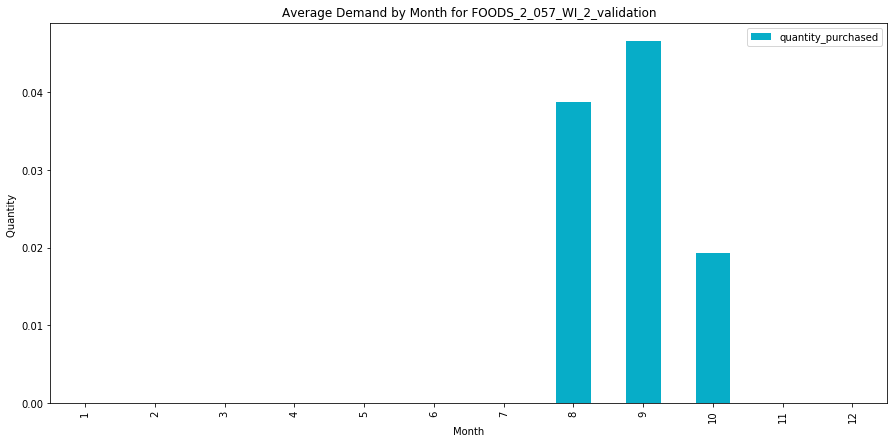

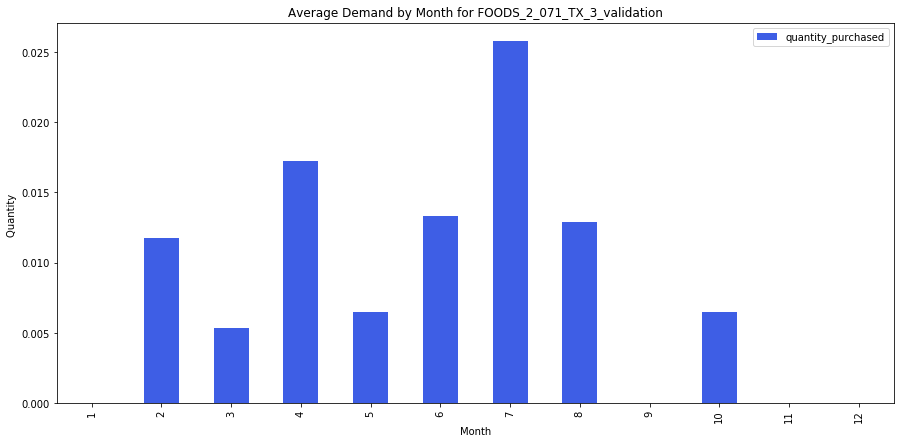

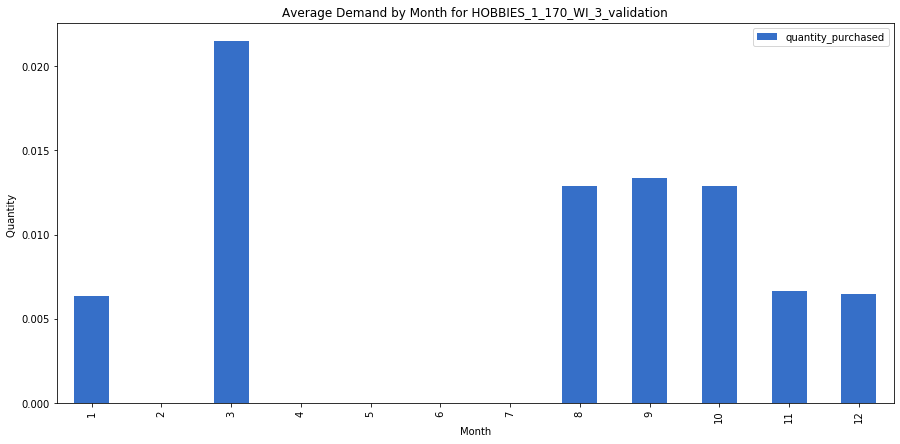

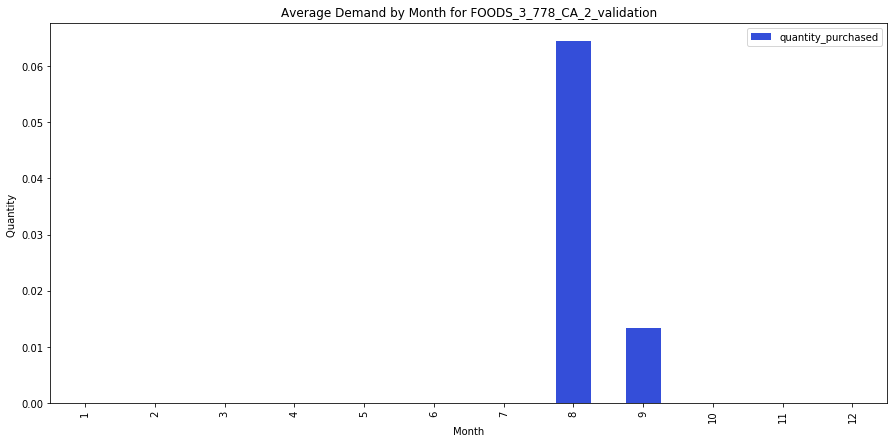

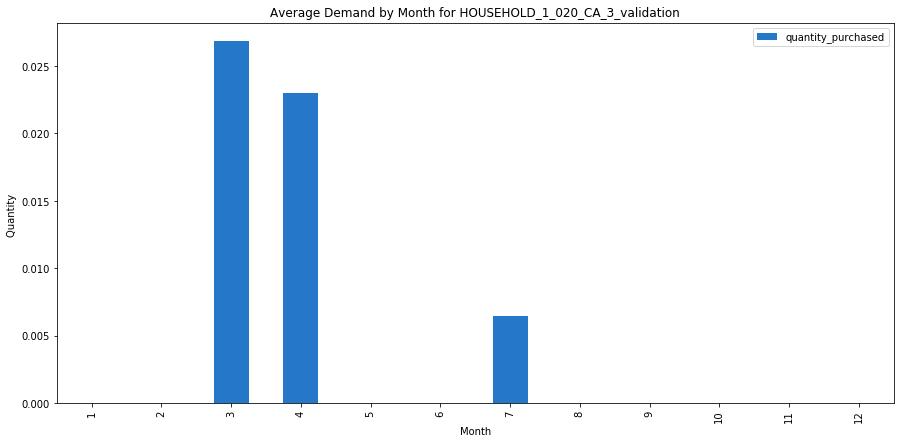

In [34]:
for product in top_10_products:
    month_of_year(product)
for product in bottom_10_products:
    month_of_year(product)

In [26]:
def box_of_month(item):
    # Create a data frame with only the item we are trying to look at sales for
    df_just_1 = df.loc[df['id'] == item]
    df_just_1.drop(['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], inplace = True, axis = 1)
    
    # 'Melt' our data frame
    melted_df = pd.melt(df_just_1, id_vars = 'id', var_name = 'date', value_name = 'quantity_purchased')
    melted_df.drop(['id'], axis = 1, inplace = True)
    
    # Merge data frame with calendar data frame in order to get actual dates
    together_now = pd.merge(melted_df, df_cal, left_on = 'date', right_on = 'd', how = 'inner')
    together_now.drop(['date_x', 'date_y', 'wm_yr_wk', 'wday', 'weekday', 'year', 'd', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis = 1, inplace = True)
    together_now.set_index('month', inplace = True)
    
    # Plot our data
    together_now.boxplot(by = 'month', figsize = (15, 7))
    plt.title('Demand by Month for {}'.format(item))
    plt.suptitle('')
    plt.xlabel('Month')
    plt.ylabel('Demand')

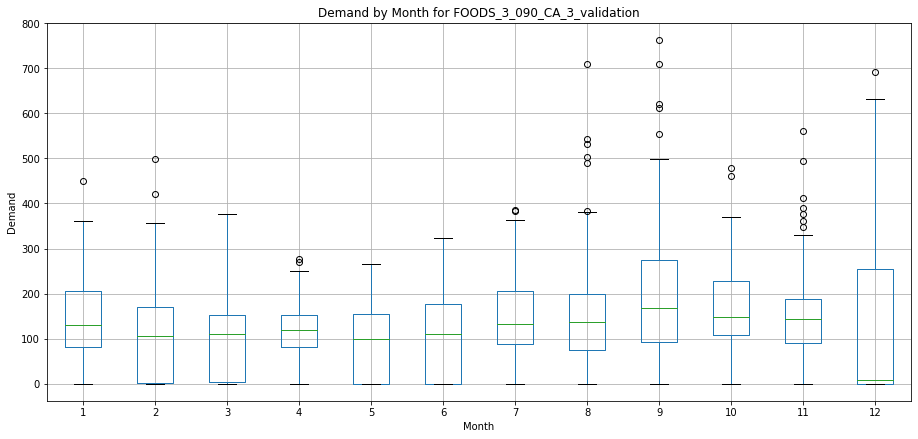

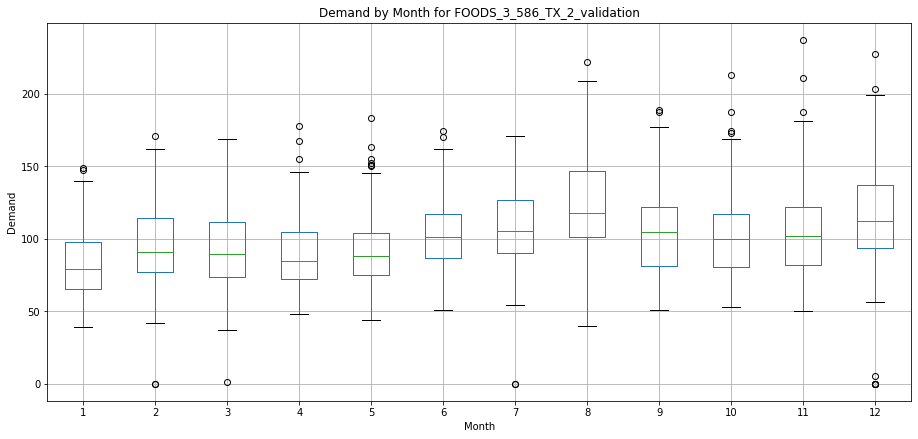

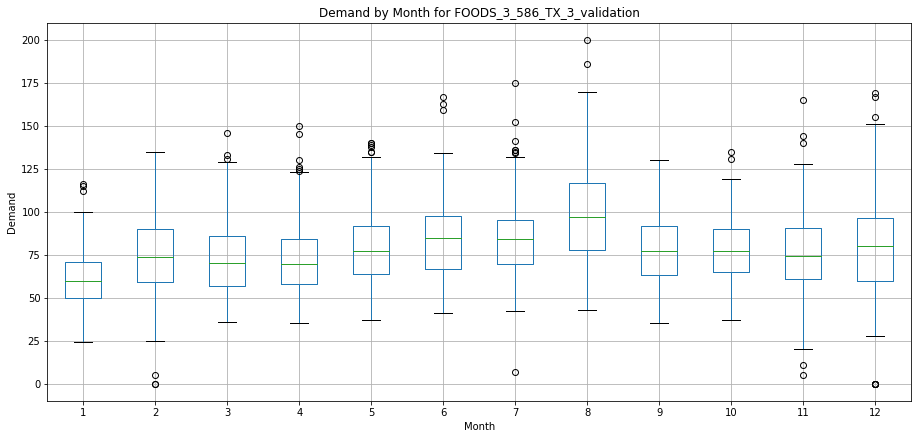

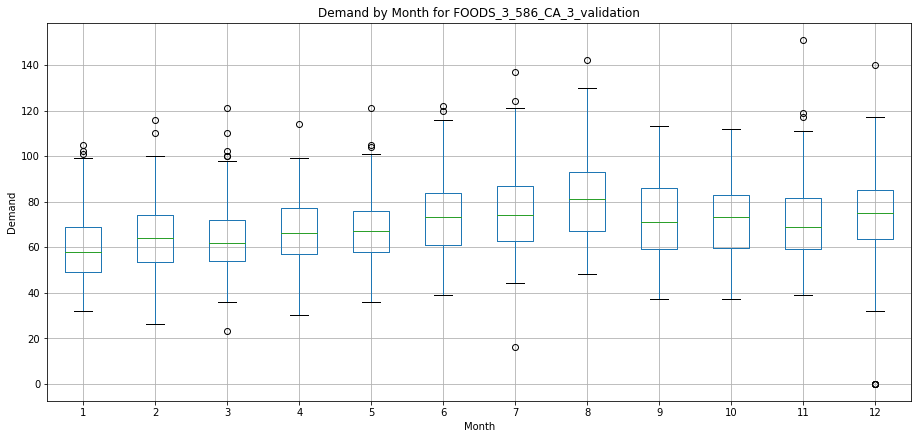

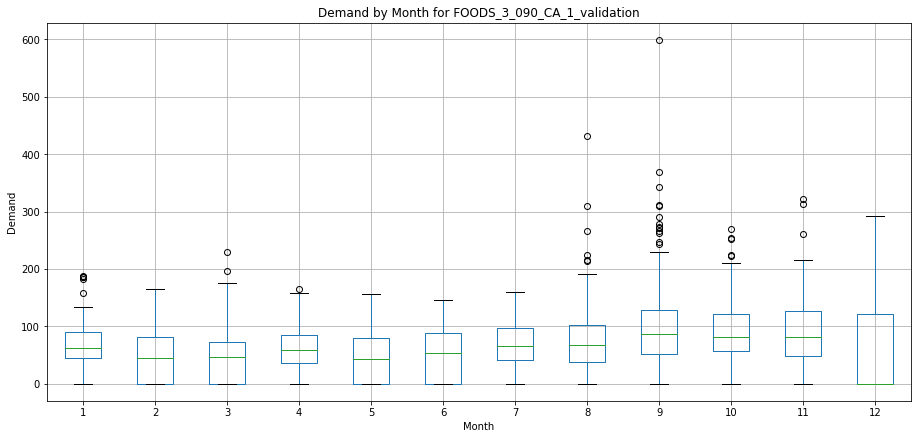

...

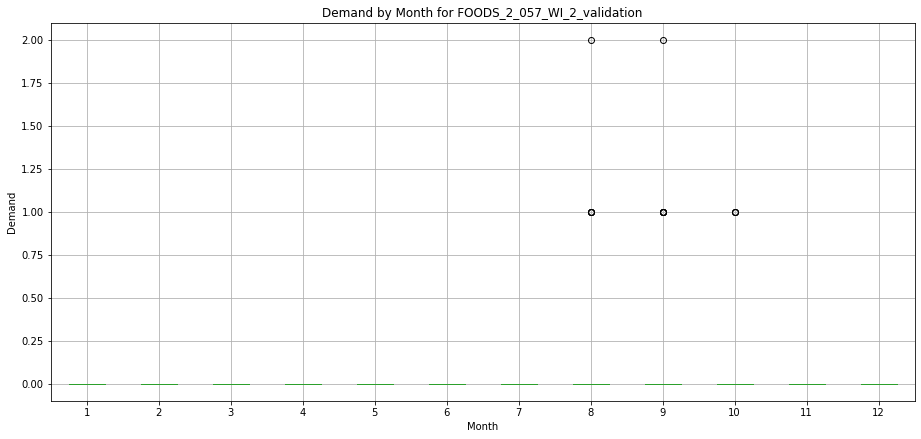

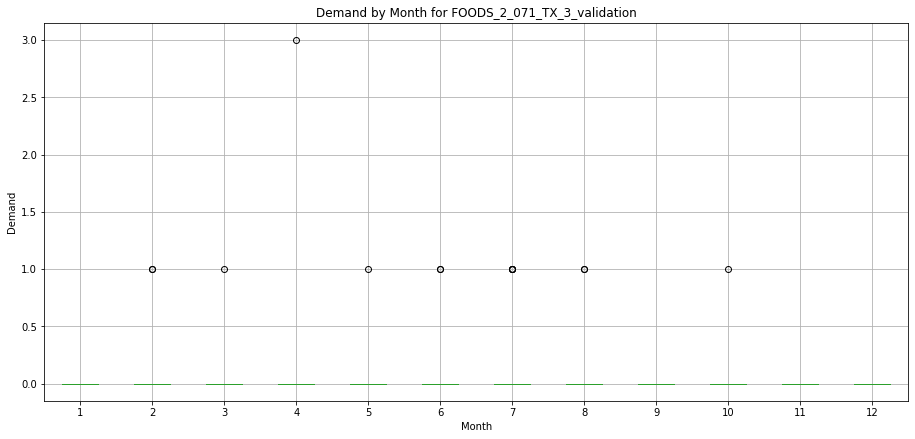

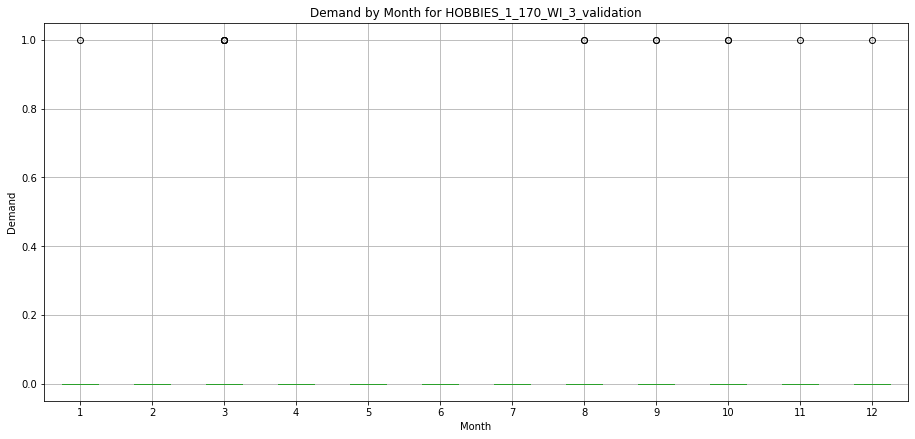

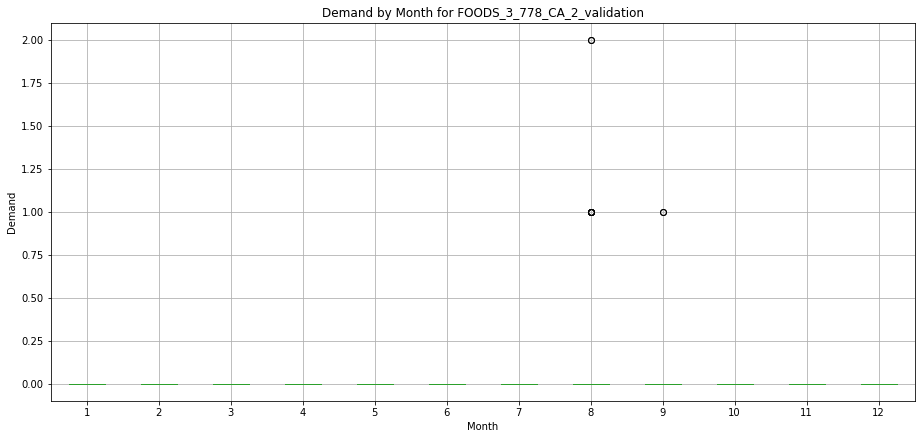

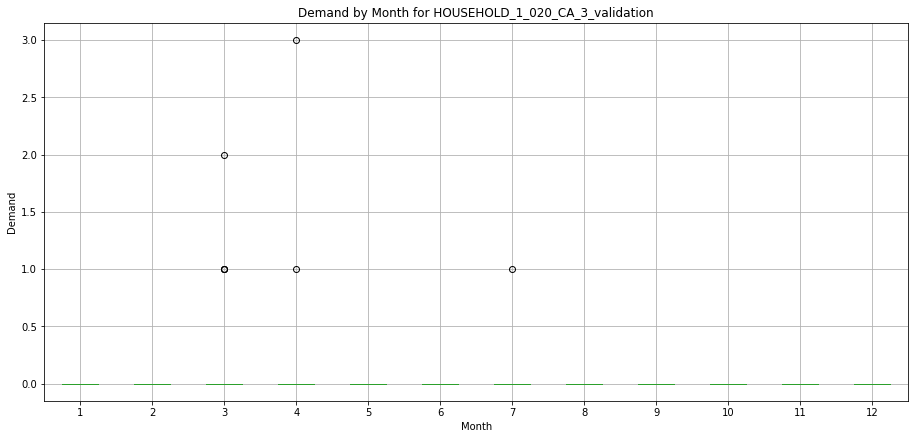

In [27]:
for product in top_10_products:
    box_of_month(product)
for product in bottom_10_products:
    box_of_month(product)

Nothing truly out of the ordinary. Obviously, we are able to more easily discern patterns in the top 10 products than the bottom 10 products. 

I think this will end up being a useful feature, overall - particularly the days of the week. Maybe not months of the year except for highly seasonal products. 

# Sales by Store

In [37]:
def by_store_by_cat(store):
    df_just_1 = df[df['store_id'] == store]
    almost = df_just_1.groupby('cat_id').sum()
    transposed = almost.T
    
    together_now = pd.merge(transposed, df_cal, left_on = transposed.index, right_on = 'd', how = 'inner')
    together_now.drop(['wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'd', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis = 1, inplace = True)
    together_now.set_index('date', inplace = True)
    
    
    together_now.plot(figsize = (15, 7), 
                      color = ((.67, .97, .02), 
                               (.02, .67, .97), 
                               (.97, .02, .67)),
                      linewidth = .85,
                      title = '{} Daily Demand by Category'.format(store))
    plt.xlabel('Time')
    plt.ylabel('Demand')

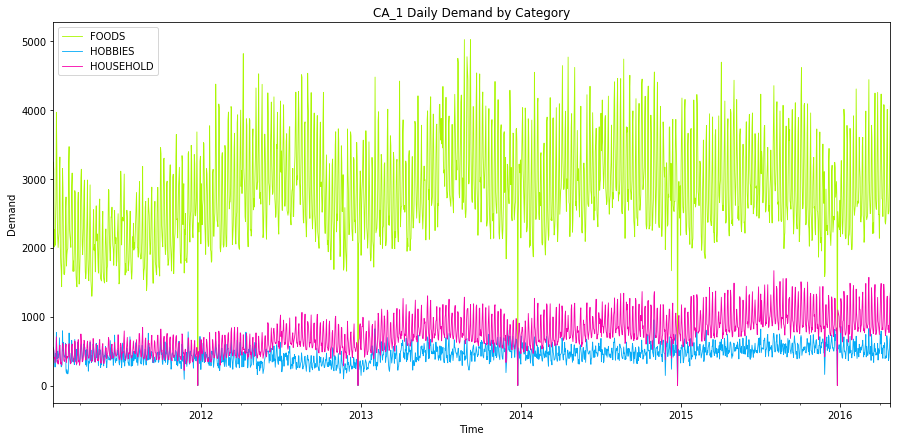

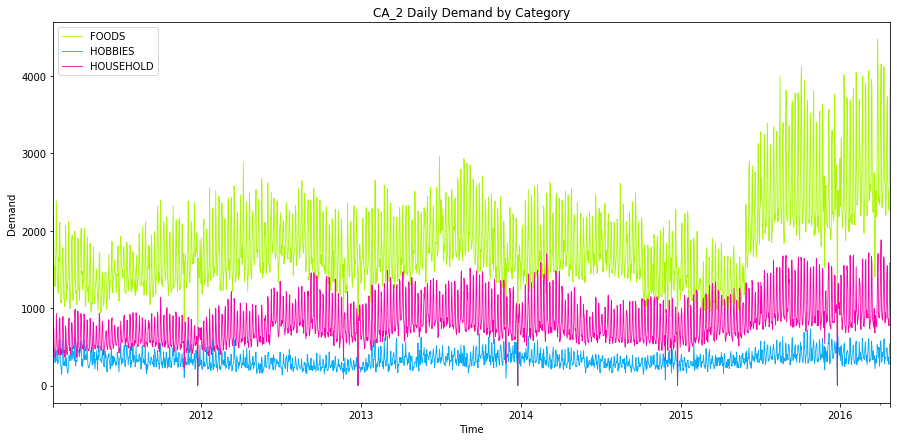

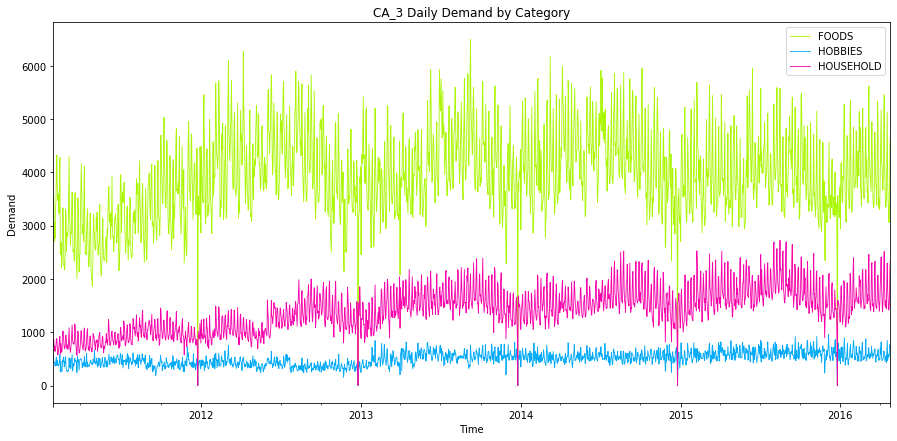

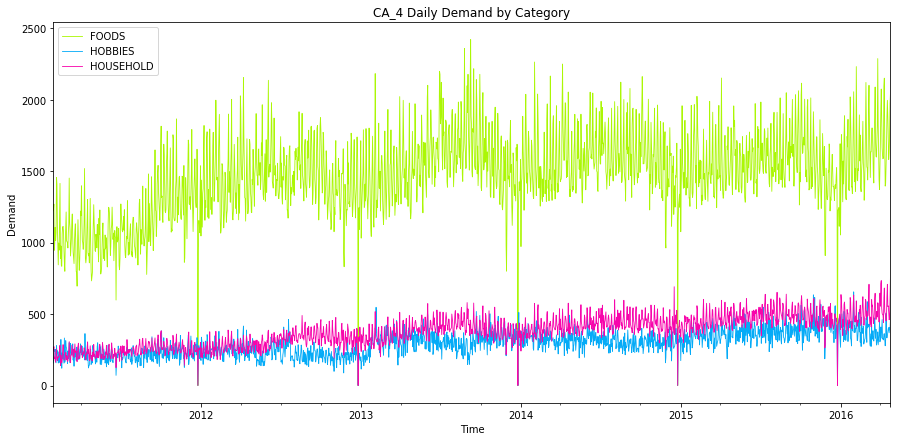

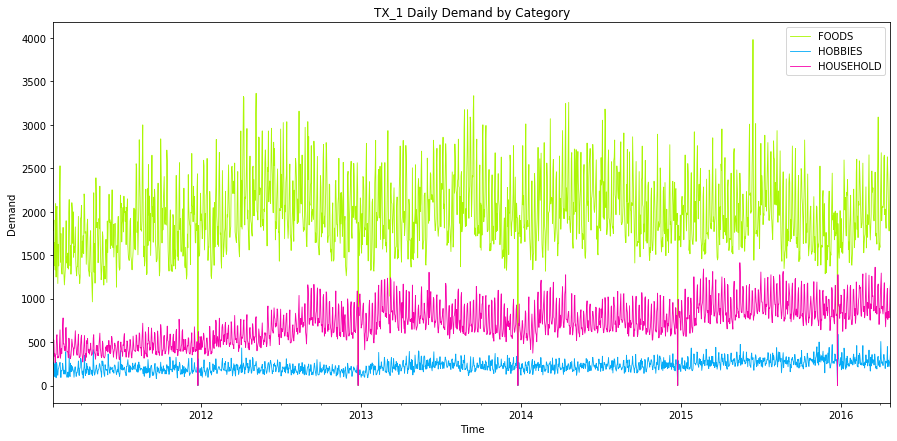

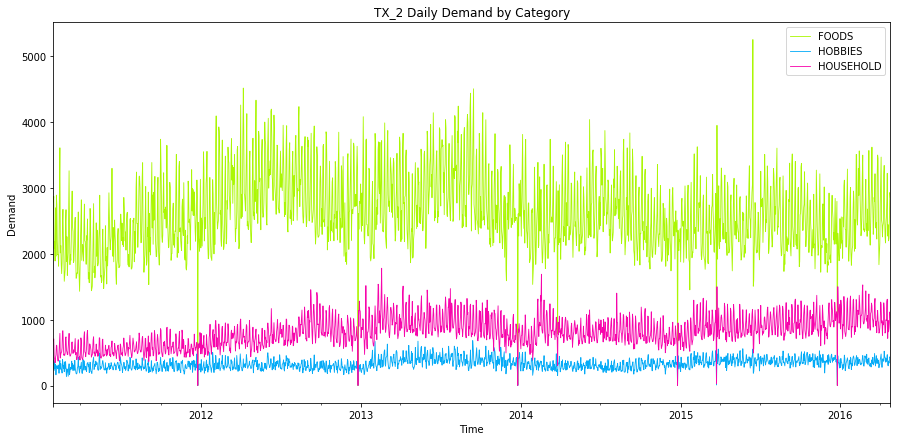

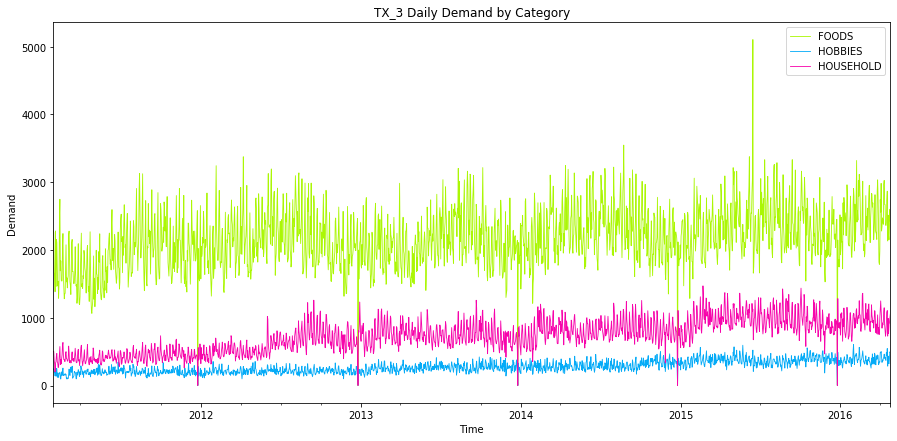

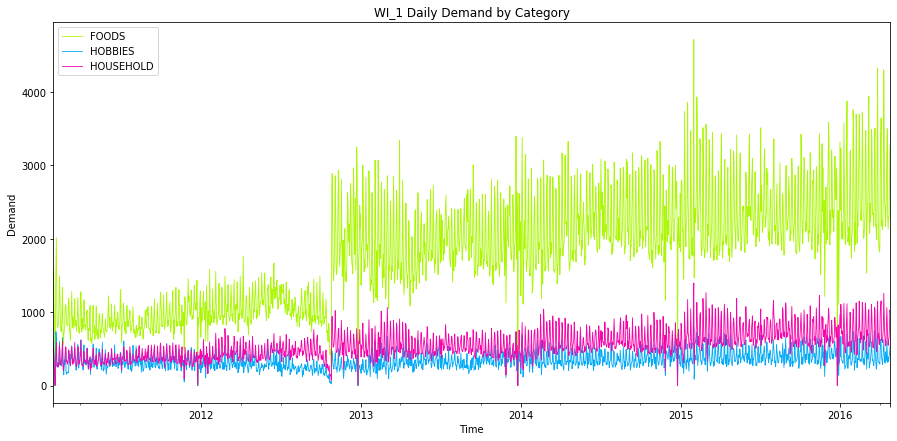

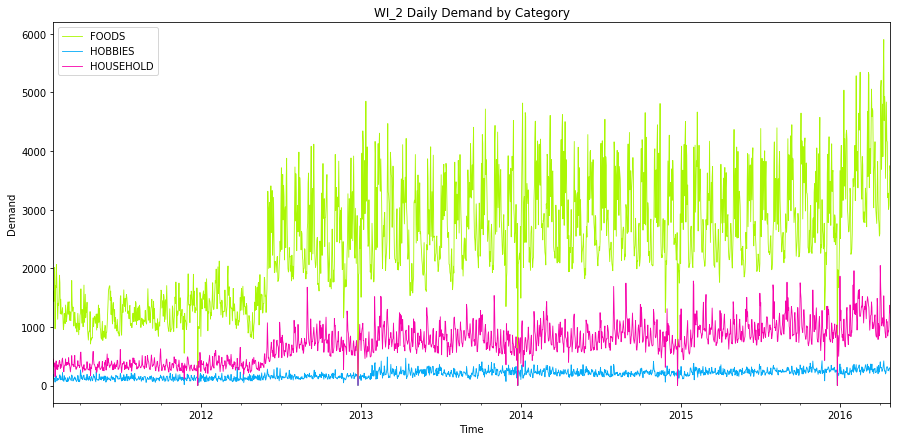

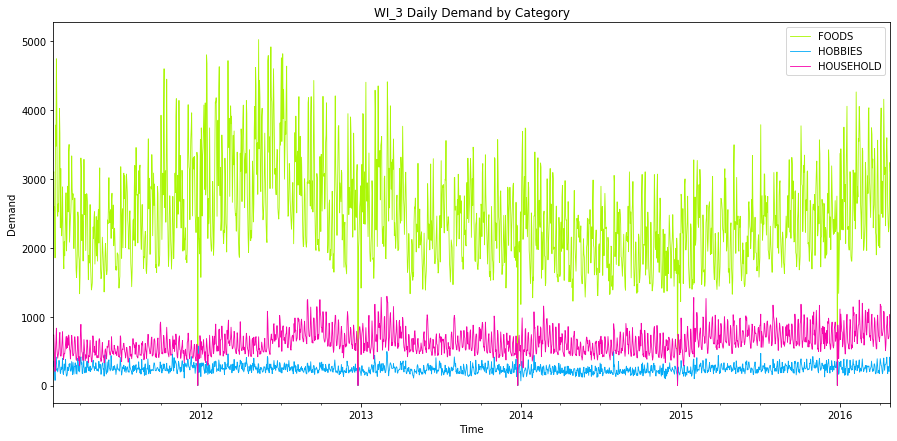

In [38]:
stores = list(df['store_id'].unique())

for store in stores:
    by_store_by_cat(store)

At every store location, we can clearly see that the 'FOODS' category is the top selling category. 'HOUSEHOLD' generally tends to be second, with 'HOBBIES' usually hovering right below.

# Sales by Product, across all stores

In [31]:
def by_prod_by_store(item):
    df_just_1 = df[df['item_id'] == item[:-16]]
    almost = df_just_1.groupby('state_id').sum()
    transposed = almost.T

    together_now = pd.merge(transposed, df_cal, left_on = transposed.index, right_on = 'd', how = 'inner')
    together_now.drop(['wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'd', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis = 1, inplace = True)
    together_now.set_index('date', inplace = True)
    
    
    together_now.plot(figsize = (15, 7), 
                      color = ((.788, .016, .910), 
                               (.910, .788, .016),
                               (.016, .910, .788)),
                      linewidth = .5,
                      subplots = False,
                      title = '{} Daily Demand by Store'.format(item))
    
    together_now.plot(figsize = (15, 7), 
                      color = ((.788, .016, .910), 
                               (.910, .788, .016),
                               (.016, .910, .788)),
                      linewidth = .5,
                      subplots = True,
                      title = '{} Daily Demand by Store'.format(item))
    plt.xlabel('Time')
    plt.ylabel('Demand')

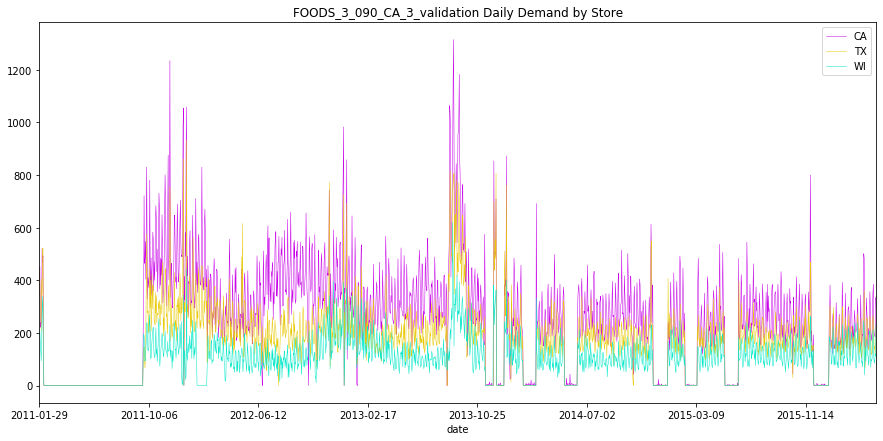

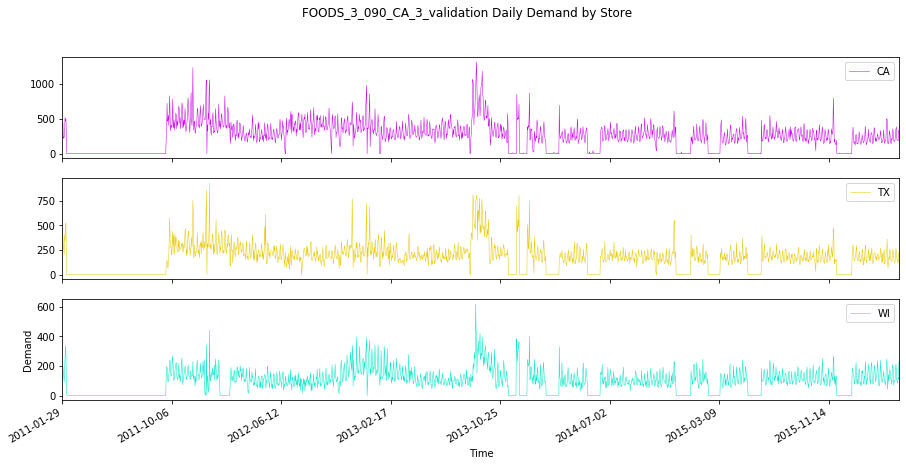

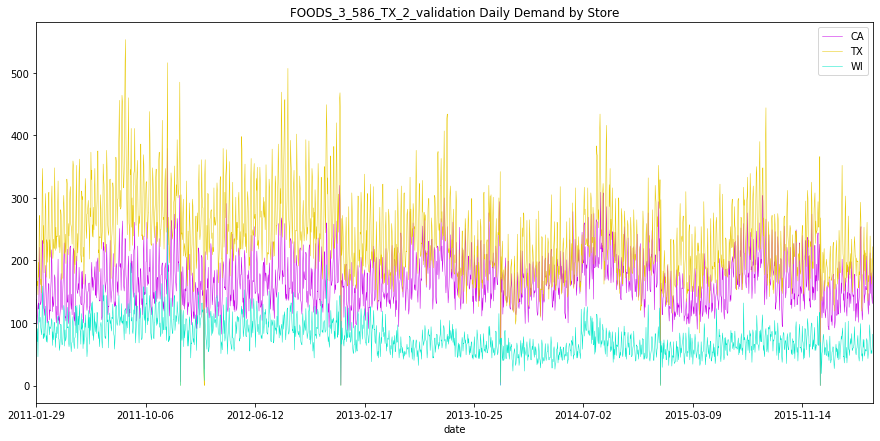

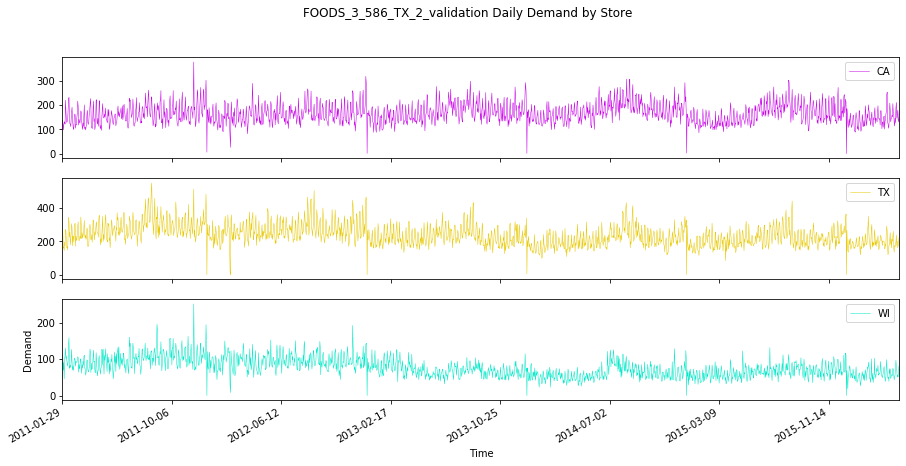

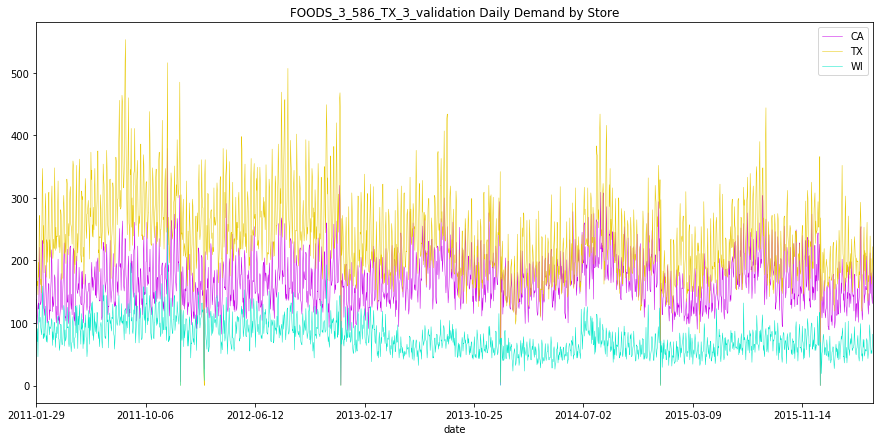

...

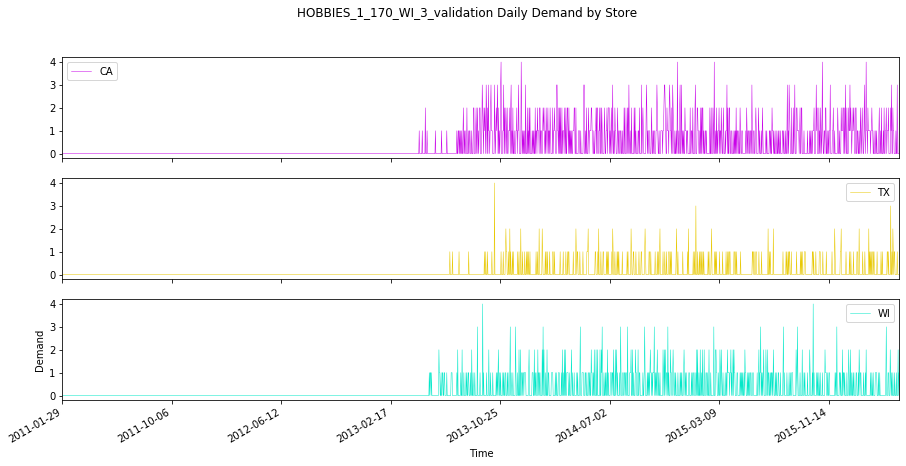

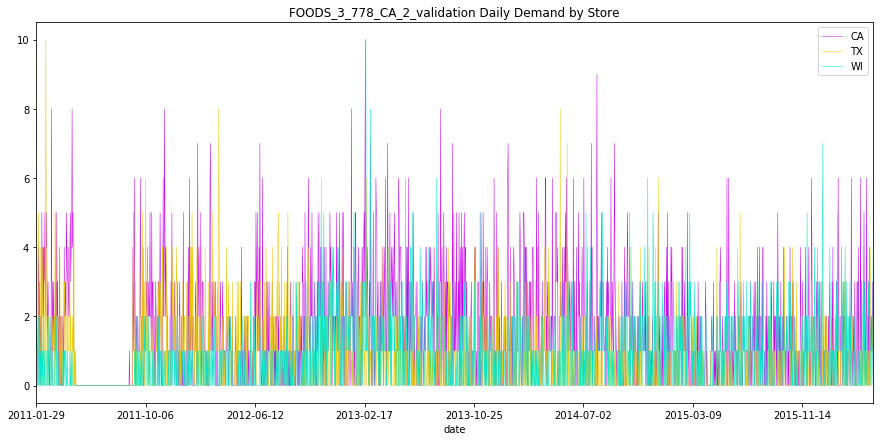

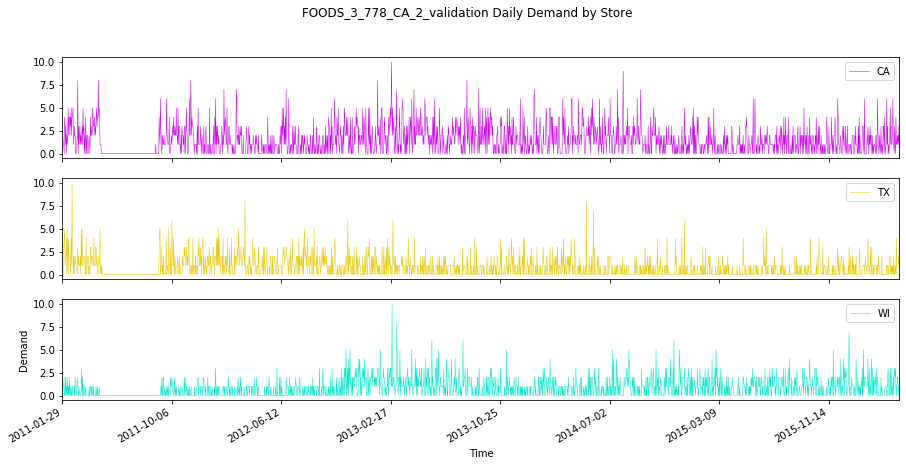

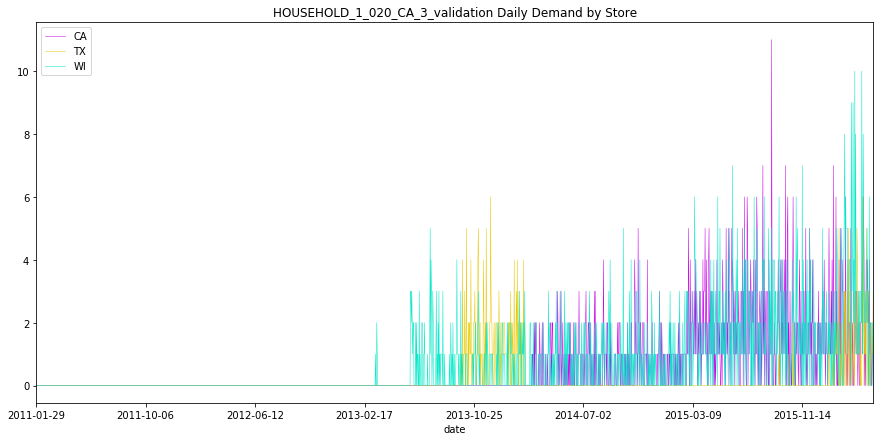

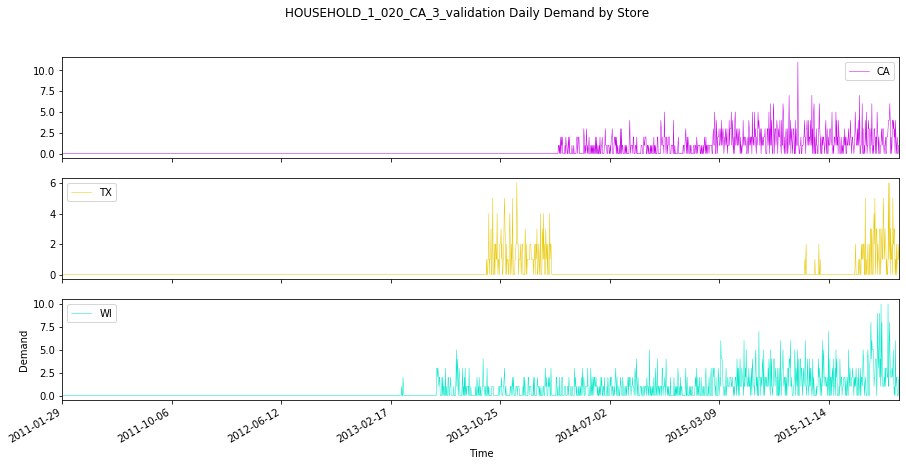

In [32]:
for product in top_10_products:
    by_prod_by_store(product)
for product in bottom_10_products:
    by_prod_by_store(product)

For the top products, are seeing CA as the top state for most but TX does take the lead with some and is usually not close behind. As one could expect, the WI stores are not selling as much as CA or TX.

Something interesting to note is that for each product, the general trend remains the same across all states. This tells us that there might be some other larger, over-arching, driving factor that is behind the movement in demand.

For example, we see a lot of the products bottom out at the same time across all stores. This potentially suggests a supply chain issue that is present at the company level and impacts multiple stores at once.

For the bottom products, we don't really see any discernible or useful patterns. 

# HEAT MAPS

In [77]:
def make_heatmap(product, years):
    # Create an empty dataframe.
    master = pd.DataFrame()
    for yr in years:
        # Formatting/combining to prepare my dataframe to become a heatmap.
        df_just_1 = df[df['id'] == product]
        new_new = df_just_1.drop(['item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], axis = 1)
        melty = pd.melt(new_new, id_vars = 'id', var_name = 'date', value_name = 'quantity_purchased')
        merged = pd.merge(melty, df_cal.reset_index(), left_on = 'date', right_on = 'd', how = 'inner')
        almost = merged.drop(['id', 'wm_yr_wk', 'weekday', 'wday', 'month', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI'], axis = 1)
        new_almost = almost.set_index('date_y')
        so_close = new_almost[yr:yr]
        yup = so_close.set_index('d')
        to_append = yup.drop(['date_x', 'year', 'index'], axis = 1)
        to_append.columns = [yr]
        to_append.reset_index(inplace = True)
        to_append.drop('d', axis = 1, inplace = True)
        master = pd.concat([master, to_append], axis = 1)
        #master.fillna(value = 0, inplace = True)
      
    transposed = master.T
    plt.matshow(transposed, interpolation=None, aspect='auto', cmap=plt.cm.Spectral_r);
    plt.ylabel('Year')
    plt.xlabel('Day')
    


## Top 10 Products

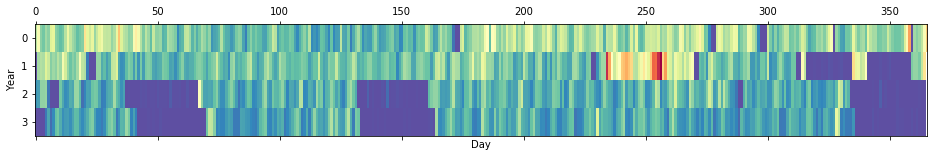

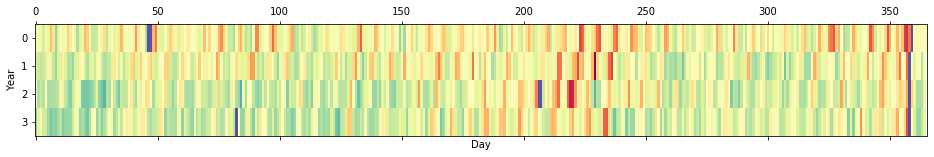

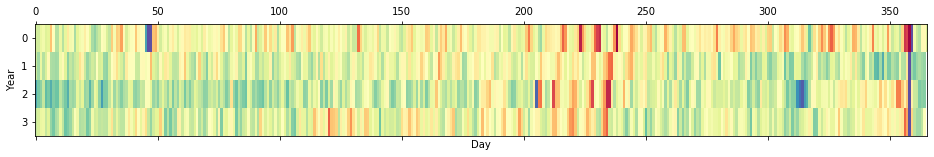

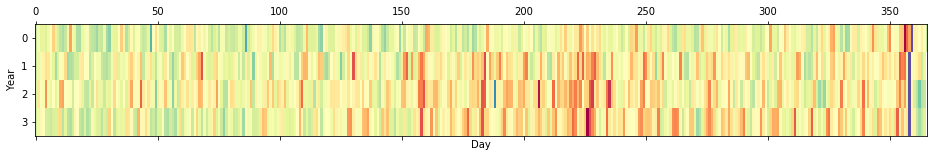

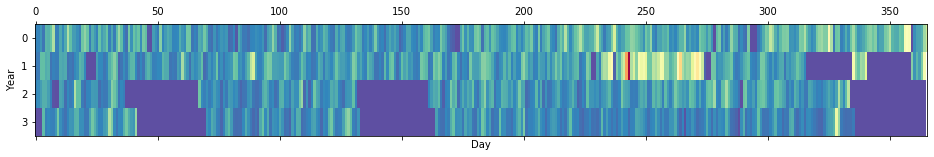

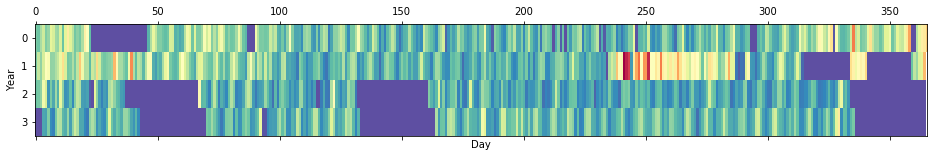

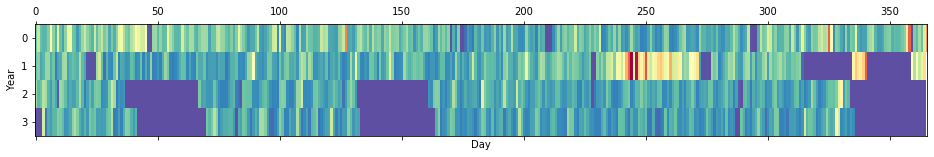

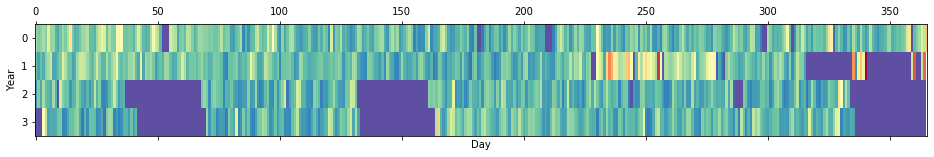

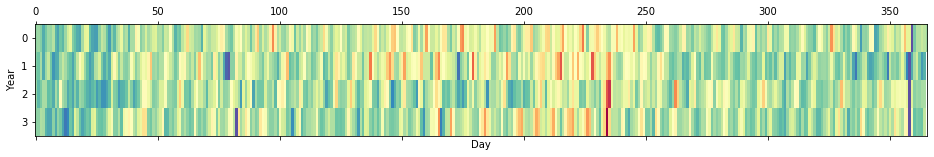

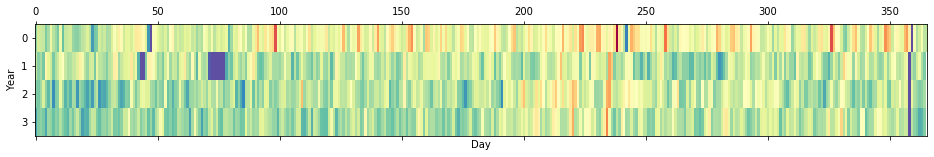

In [78]:
for prod in top_10_products:
    make_heatmap(prod, ['2012', '2013', '2014', '2015'])

## Bottom 10 Products

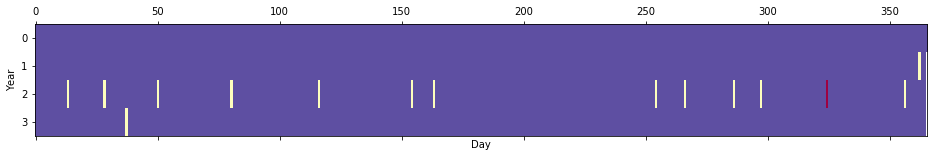

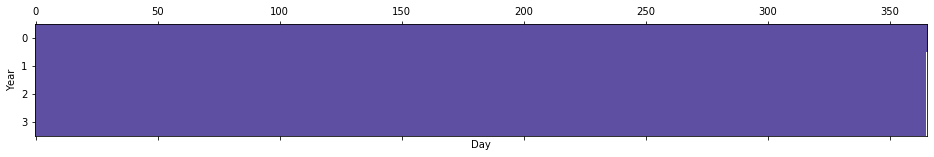

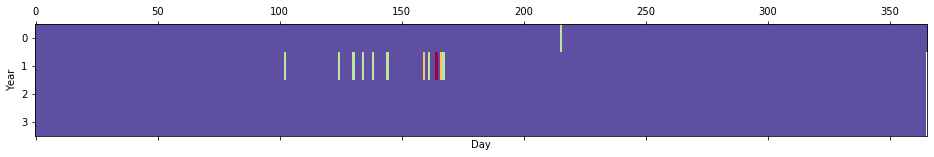

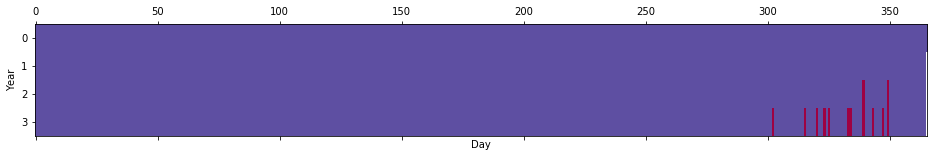

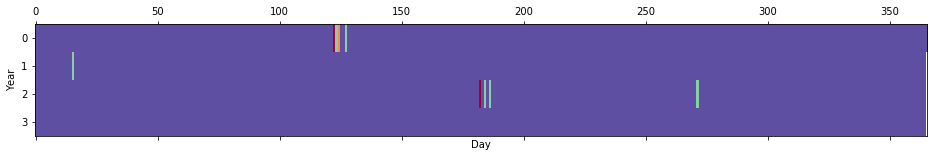

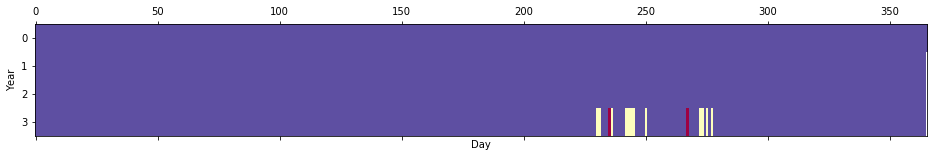

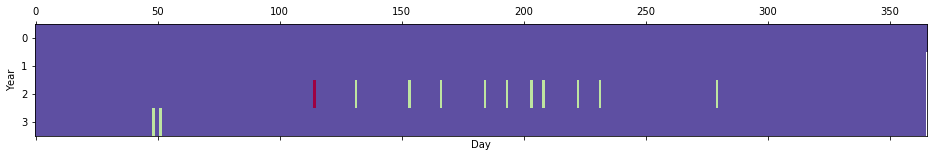

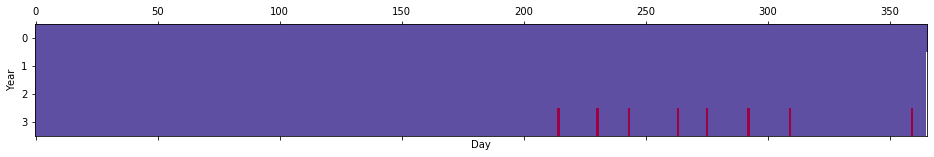

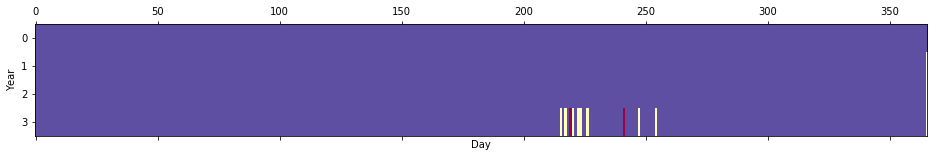

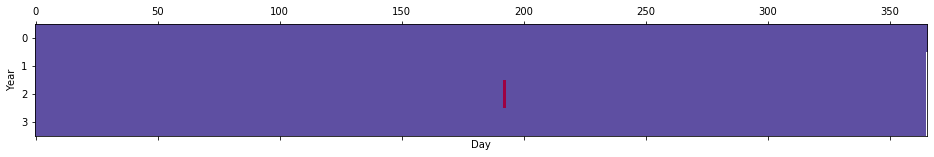

In [79]:
for prod in bottom_10_products:
    make_heatmap(prod, ['2012', '2013', '2014', '2015'])

For the bottom products, these heat maps make it even more apparent how little they sell and how little of a pattern there is.